In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu
import matplotlib
from matplotlib import gridspec

In [ ]:
# Load the species rows CSV file
species_rows_file = 'D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/data_combined_df_output/expression_species_rows.csv'
species_rows_df = pd.read_csv(species_rows_file)

# Load the predictions from the npy file
pred_file = 'D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/data_combined_df_output/Ascomycota_pred.npy'
pred_array = np.load(pred_file)
pred_array = pred_array.flatten()  # This makes sure that pred_array is a 1-dimensional array

# Create a dictionary using species names as keys and data points as values
native_pred_dict = {}
for species in species_rows_df.columns[:]: 
    indices = species_rows_df[species]
    # Remove NaNs, negative values, and convert to integer
    indices = indices[indices >= 0].dropna().astype(int)
    # Make sure indices are within the length of pred_array
    indices = indices[indices < len(pred_array)]
    
    # Split the species name by "_" and take the first two parts
    name_parts = species.split("_")[:2]
    # Capitalize the second part
    name_parts[1] = name_parts[1].capitalize()
    # Join them back together
    new_species = "_".join(name_parts)

    native_pred_dict[new_species] = pred_array[indices]

In [ ]:
# Load the species rows CSV file
species_rows_file = 'D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_combined_output/expression_species_rows.csv'
species_rows_df = pd.read_csv(species_rows_file)

# Load the predictions from the npy file
pred_file = 'D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_combined_output/GFP_Ascomycota_pred.npy'
pred_array = np.load(pred_file)
pred_array = pred_array.flatten()  # This makes sure that pred_array is a 1-dimensional array

# Create a dictionary using species names as keys and data points as values
gfp_pred_dict = {}
for species in species_rows_df.columns[:]:  # Ignore the first column ('Unnamed: 0')
    indices = species_rows_df[species]
    # Remove NaNs, negative values, and convert to integer
    indices = indices[indices >= 0].dropna().astype(int)
    # Make sure indices are within the length of pred_array
    indices = indices[indices < len(pred_array)]
    
    # Split the species name by "_" and take the first two parts
    name_parts = species.split("_")[:2]
    # Capitalize the second part
    name_parts[1] = name_parts[1].capitalize()
    # Join them back together
    new_species = "_".join(name_parts)

    gfp_pred_dict[new_species] = pred_array[indices]

In [ ]:
from scipy import special

lmbda = 0.22

def boxtpm(x, lmbda):
    return special.inv_boxcox(x, lmbda)

native_pred_dict_transformed = {key: boxtpm(value, lmbda) for key, value in native_pred_dict.items()}
gfp_pred_dict_transformed = {key: boxtpm(value, lmbda) for key, value in gfp_pred_dict.items()}


In [ ]:
fn3 = 'tfiid_genes_predictions_gfp.csv'
## datasets
folder = 'D:/Users/ernes/Documents/1KCL/Zelezniak/Data1/'
df_gfp = pd.read_csv(folder+fn3)
# Saccharomyces cerevisiae data
sc_gfp_data = df_gfp.ypred_gfptag.values
sc_native_data = df_gfp.ypred.values

In [ ]:
sc_gfp_data = df_gfp.ypred_gfptag.values
sc_native_data = df_gfp.ypred.values

In [ ]:
# Add Saccharomyces cerevisiae to the top of the dictionaries
native_pred_dict = {'Saccharomyces_cerevisiae': sc_native_data, **native_pred_dict}
gfp_pred_dict = {'Saccharomyces_cerevisiae': sc_gfp_data, **gfp_pred_dict}

In [ ]:
# Load Ascomycota data
Ascomycota_native = np.load('D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/data_combined_df_output/Ascomycota_pred.npy')
Ascomycota_gfp = np.load('D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_combined_output/GFP_Ascomycota_pred.npy')

# The number of species
n_species = len(native_pred_dict.keys())



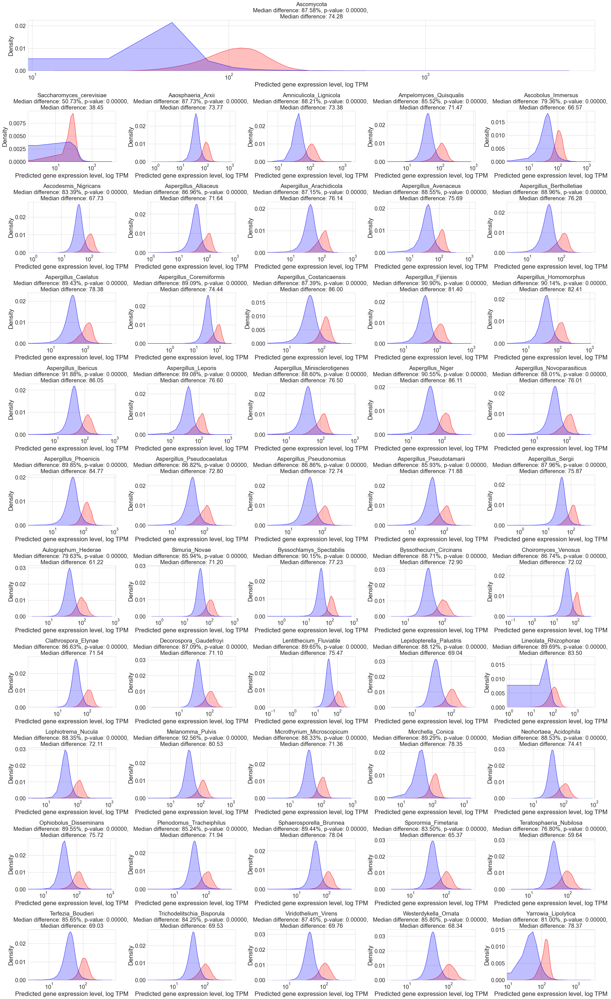

In [685]:
# Increase default font size
plt.rc('font', size=17)

# Load Ascomycota data
Ascomycota_native = np.load('D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/data_combined_df_output/Ascomycota_pred.npy')
Ascomycota_gfp = np.load('D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_combined_output/GFP_Ascomycota_pred.npy')

# The number of species
n_species = len(native_pred_dict.keys())

# The number of columns you want in your subplot grid
n_cols = 5

# Calculate the number of rows needed
n_rows = n_species // n_cols
if n_species % n_cols:
    n_rows += 1 # +1 for the extra row for the first plot

# Create the grid for subplots
fig = plt.figure(figsize=(30, 5*n_rows)) # Increase figure size for larger subplots
gs = gridspec.GridSpec(n_rows+1, n_cols) # +1 for the first large plot

# Create a large plot for Ascomycota
ax0 = fig.add_subplot(gs[0, :])

y = boxtpm(Ascomycota_native.flatten(), lmbda)
x = boxtpm(Ascomycota_gfp.flatten(), lmbda)

median_gfp = np.median(x)
median_native = np.median(y)
median_diff = median_gfp - median_native
median_diff_perc = (median_diff / ((median_gfp + median_native) / 2)) * 100

u_stat, p_val = mannwhitneyu(x, y, alternative='two-sided')

sns.kdeplot(x, ax=ax0, shade=True, color="r", label='GFP coding sequence')
sns.kdeplot(y, ax=ax0, shade=True, color="b", label='Native coding sequence')

ax0.set_xscale('log')
ax0.set_ylabel('Density')
ax0.set_xlabel('Predicted gene expression level, log TPM')
ax0.set_title(f'Ascomycota\nMedian difference: {median_diff_perc:.2f}%, p-value: {p_val:.5f}, \nMedian difference: {median_diff:.2f}')

species_list = list(native_pred_dict.keys())

# For each species, create a subplot in the remaining grid
for i, species in enumerate(species_list):
    row = (i // n_cols) + 1
    col = i % n_cols
    ax = fig.add_subplot(gs[row, col])

    y = boxtpm(native_pred_dict[species].flatten(), lmbda)
    x = boxtpm(gfp_pred_dict[species].flatten(), lmbda)

    median_gfp = np.median(x)
    median_native = np.median(y)
    median_diff = median_gfp - median_native
    median_diff_perc = (median_diff / ((median_gfp + median_native) / 2)) * 100

    u_stat, p_val = mannwhitneyu(x, y, alternative='two-sided')

    sns.kdeplot(x, ax=ax, shade=True, color="r", label='GFP coding sequence')
    sns.kdeplot(y, ax=ax, shade=True, color="b", label='Native coding sequence')

    ax.set_xscale('log')
    ax.set_ylabel('Density')
    ax.set_xlabel('Predicted gene expression level, log TPM')
    ax.set_title(f'{species}\nMedian difference: {median_diff_perc:.2f}%, p-value: {p_val:.5f}, \nMedian difference: {median_diff:.2f}')

plt.tight_layout()
plt.show()

In [ ]:
# Load Ascomycota data
Ascomycota_native = np.load('D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/data_combined_df_output/Ascomycota_pred.npy')
Ascomycota_gfp = np.load('D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_combined_output/GFP_Ascomycota_pred.npy')

native_pred_dict = {'Ascomycota': Ascomycota_native, **native_pred_dict}
gfp_pred_dict = {'Ascomycota': Ascomycota_gfp, **gfp_pred_dict}

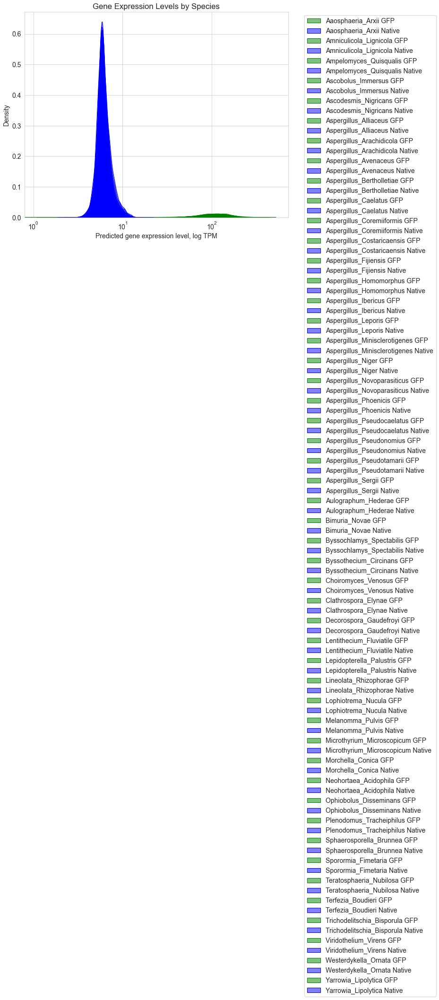

In [614]:
# Set up the plot
plt.figure(figsize=(10, 8))
# For each species
for species in native_pred_dict_transformed.keys():

    # Check if species is also present in the gfp_pred_dict
    if species not in gfp_pred_dict:
        continue

    # Load data
    y = native_pred_dict[species]
    x = gfp_pred_dict_transformed[species]

    # Set color and line width based on species
    if species != 'Saccharomyces_cerevisiae':
        color_native = 'blue'
        color_gfp = 'green'
        lw = 1
        alpha = 0.5
    else:
        color_native = 'orange'
        color_gfp = 'red'
        lw = 3
        alpha = 0.8

    # Plot the kernel density estimate for each dataset
    sns.kdeplot(x, shade=True, color=color_gfp, alpha=alpha, bw_adjust=1, linewidth=lw, label=f'{species} GFP')
    sns.kdeplot(y, shade=True, color=color_native, alpha=alpha, bw_adjust=1, linewidth=lw, label=f'{species} Native')

plt.xscale('log')
plt.ylabel('Density')
plt.xlabel('Predicted gene expression level, log TPM')
plt.title('Gene Expression Levels by Species')

# To avoid legend clutter
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()


D:\Users\ernes\Documents\Anaconda\lib\site-packages\seaborn\distributions.py:967: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], **plot_kws)
D:\Users\ernes\Documents\Anaconda\lib\site-packages\seaborn\distributions.py:1015: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  artist = ax.fill_between(
D:\Users\ernes\Documents\Anaconda\lib\site-packages\seaborn\distributions.py:967: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  scout = self.ax.fill_between([], [], **plot_kws)
D:\Users\ernes\Documents\Anaconda\lib\site-packages\seaborn\distributions.py:1015: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  ar

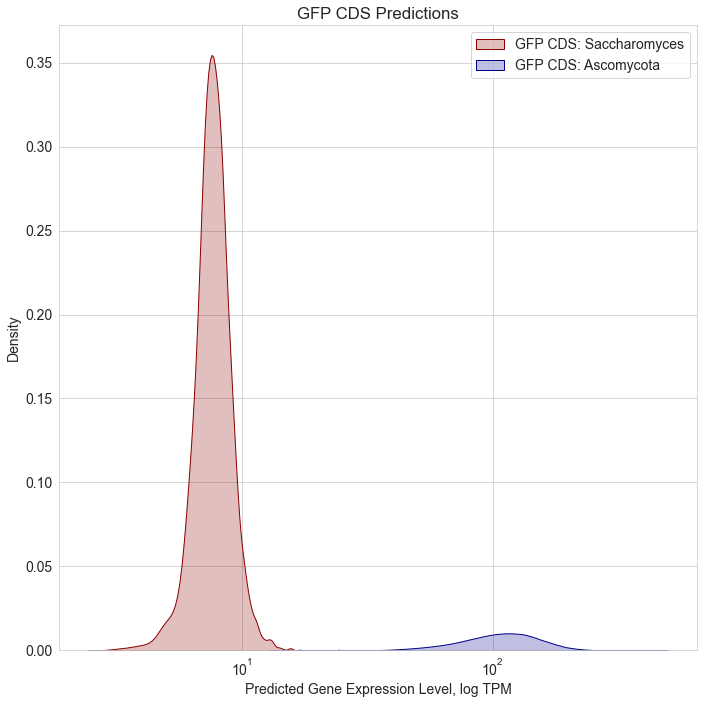

In [615]:
import seaborn as sns
import matplotlib.pyplot as plt
# Load the numpy arrays
native_pred_array = np.load('D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/data_combined_df_output/Ascomycota_pred.npy')
gfp_pred_array = np.load('D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_combined_output/GFP_Ascomycota_pred.npy')
native_pred_array_transformed = boxtpm(native_pred_array, lmbda)
gfp_pred_array_transformed = boxtpm(gfp_pred_array, lmbda)
# Create subplots
#fig, (ax1, ax2) = plt.subplots(2, figsize=(10,10))
fig, (ax2) = plt.subplots(1, figsize=(10,10))
# Create density plot for Native CDS predictions
#sns.kdeplot(sc_native_data, color='darkred', shade=True, Label='Native CDS: Saccharomyces', ax=ax1)
#sns.kdeplot(native_pred_array_transformed.flatten(), color='darkblue', shade=True, Label='Native CDS: Ascomycota', ax=ax1)
#ax1.set_xlabel('Predicted Gene Expression Level, log TPM')
#ax1.set_ylabel('Density')
#ax1.set_title('Native CDS Predictions')
#ax1.legend()
#ax1.set_xscale('log')

# Create density plot for GFP CDS predictions
sns.kdeplot(sc_gfp_data, color='darkred', shade=True, Label='GFP CDS: Saccharomyces', ax=ax2)
sns.kdeplot(gfp_pred_array_transformed.flatten(), color='darkblue', shade=True, Label='GFP CDS: Ascomycota', ax=ax2)
ax2.set_xlabel('Predicted Gene Expression Level, log TPM')
ax2.set_ylabel('Density')
ax2.set_title('GFP CDS Predictions')
ax2.legend()
ax2.set_xscale('log')

# Tight layout
plt.tight_layout()
plt.show()


Aaosphaeria_Arxii [ 9.86516    8.702513   7.4766626 ...  9.60866    7.981915  10.158073 ]
Amniculicola_Lignicola [6.9574475 9.051777  9.563999  ... 6.133963  6.300941  8.168323 ]
Ampelomyces_Quisqualis [9.57017  8.078639 8.346651 ... 8.210822 9.01806  8.355364]
Ascobolus_Immersus [8.482015 8.43309  7.164706 ... 8.78146  8.966575 8.835614]
Ascodesmis_Nigricans [8.486106  9.533059  8.81864   ... 8.962505  6.8227954 9.083183 ]
Aspergillus_Alliaceus [8.286455  7.195724  9.1061535 ... 8.878536  8.342495  8.768535 ]
Aspergillus_Arachidicola [9.079378  8.072748  7.8133264 ... 8.166818  8.159739  7.7989035]
Aspergillus_Avenaceus [8.498599  9.564416  6.9947953 ... 6.583483  9.838404  8.241159 ]
Aspergillus_Bertholletiae [9.405075  9.6075735 8.738061  ... 8.647374  8.546244  8.248696 ]
Aspergillus_Caelatus [ 8.838922  10.088196   7.563749  ...  9.232365   8.9788475  9.521281 ]
Aspergillus_Coremiiformis [8.49796   9.942291  8.329149  ... 8.389869  7.2478337 8.935309 ]
Aspergillus_Costaricaensis [

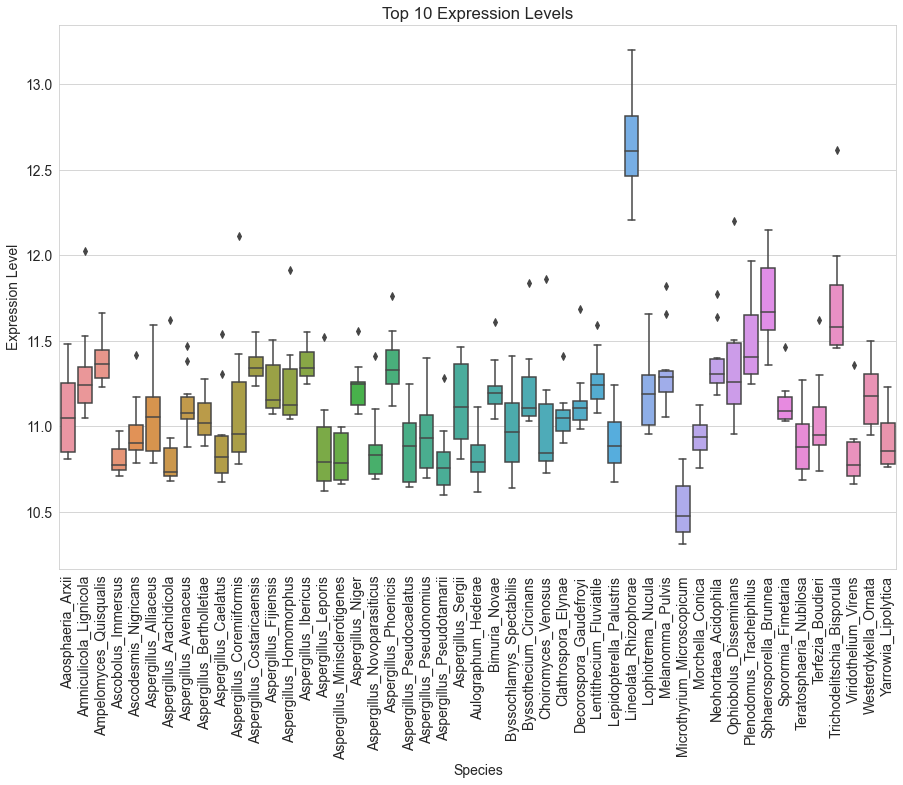

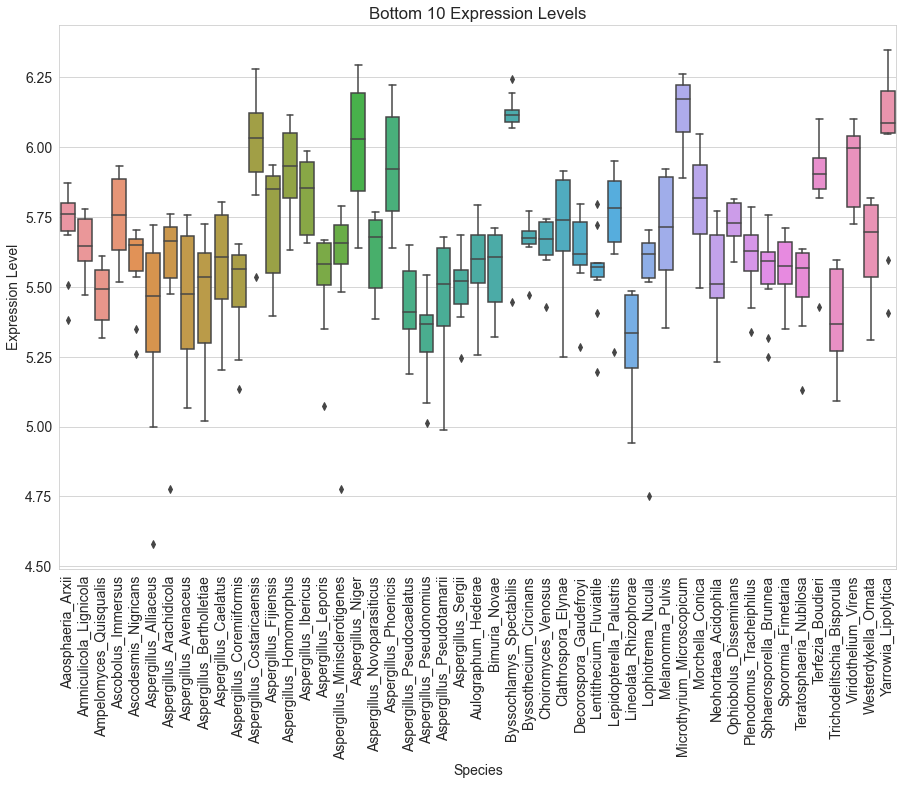

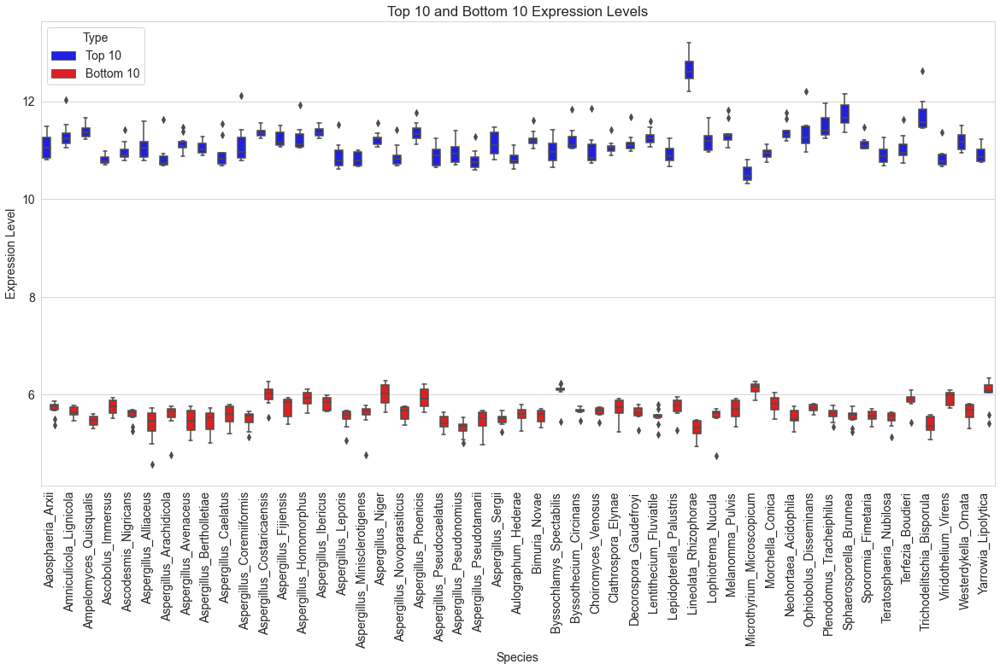

In [616]:
# Load the species rows CSV file
species_rows_file = 'D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_combined_output/expression_species_rows.csv'
species_rows_df = pd.read_csv(species_rows_file)

# Load the predictions from the npy file
pred_file = 'D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_combined_output/GFP_Ascomycota_pred.npy'
pred_array = np.load(pred_file)
pred_array = pred_array.flatten()  # This makes sure that pred_array is a 1-dimensional array

# Create a dictionary using species names as keys and data points as values
gfp_pred_dict = {}
for species in species_rows_df.columns[:]:  # Ignore the first column ('Unnamed: 0')
    indices = species_rows_df[species]
    # Remove NaNs, negative values, and convert to integer
    indices = indices[indices >= 0].dropna().astype(int)
    # Make sure indices are within the length of pred_array
    indices = indices[indices < len(pred_array)]
    
    # Split the species name by "_" and take the first two parts
    name_parts = species.split("_")[:2]
    # Capitalize the second part
    name_parts[1] = name_parts[1].capitalize()
    # Join them back together
    new_species = "_".join(name_parts)

    gfp_pred_dict[new_species] = pred_array[indices]

# Print the structure of the dictionary
for species, value in gfp_pred_dict.items():
    print(species, value)

# Dictionaries to store the top 10 and bottom 10 expression levels and indices
top_10_expr = {}
bottom_10_expr = {}
top_10_indices = {}
bottom_10_indices = {}

# For each species
for species, values in gfp_pred_dict.items():
    # Convert the values to a Series for easier handling
    values_series = pd.Series(values)
    
    # Get the top 10 and bottom 10 expression levels and their indices
    top_10_expr[species] = values_series.nlargest(10).values
    bottom_10_expr[species] = values_series.nsmallest(10).values
    top_10_indices[species] = values_series.nlargest(10).index.values
    bottom_10_indices[species] = values_series.nsmallest(10).index.values
    
# Create DataFrames from the dictionaries
df_top_10_expr = pd.DataFrame(top_10_expr)
df_bottom_10_expr = pd.DataFrame(bottom_10_expr)
df_top_10_indices = pd.DataFrame(top_10_indices)
df_bottom_10_indices = pd.DataFrame(bottom_10_indices)

# Convert the expression level DataFrames to long format for seaborn
df_top_10_expr_long = df_top_10_expr.melt(var_name='Species', value_name='Expression Level')
df_bottom_10_expr_long = df_bottom_10_expr.melt(var_name='Species', value_name='Expression Level')

# Create the boxplots
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_top_10_expr_long)
plt.xticks(rotation=90)
plt.title('Top 10 Expression Levels')
plt.show()

plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_bottom_10_expr_long)
plt.xticks(rotation=90)
plt.title('Bottom 10 Expression Levels')
plt.show()

# Create a 'Type' column to distinguish between top 10 and bottom 10
df_top_10_expr_long['Type'] = 'Top 10'
df_bottom_10_expr_long['Type'] = 'Bottom 10'

# Combine the two DataFrames
df_combined = pd.concat([df_top_10_expr_long, df_bottom_10_expr_long])

# Create the combined boxplot
plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Type', data=df_combined, palette=['blue', 'red'])
plt.xticks(rotation=90)
plt.title('Top 10 and Bottom 10 Expression Levels')
plt.show()

In [617]:
# Apply the boxcox transformation to your dataframes
df_top_10_expr_long['Expression Level'] = boxtpm(df_top_10_expr_long['Expression Level'], lmbda)
df_bottom_10_expr_long['Expression Level'] = boxtpm(df_bottom_10_expr_long['Expression Level'], lmbda)


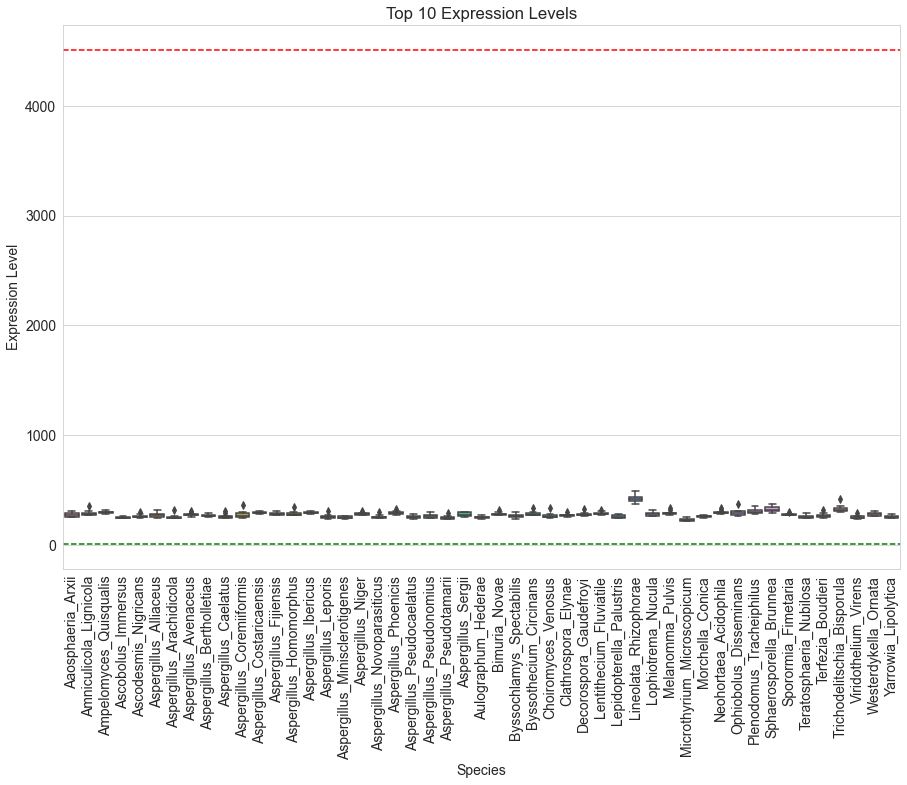

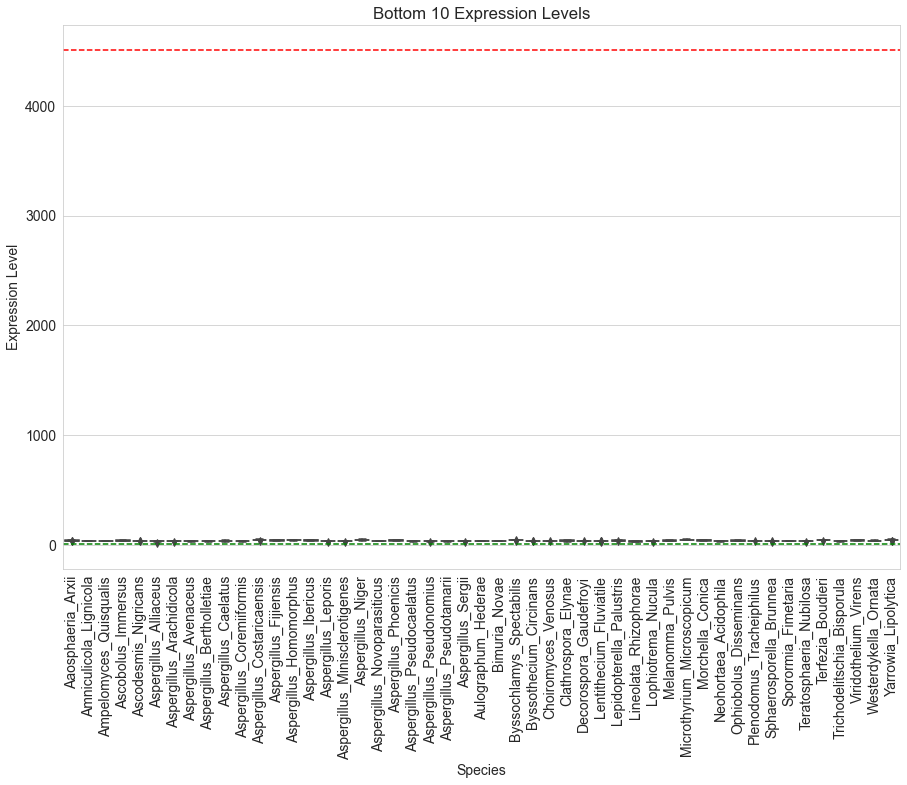

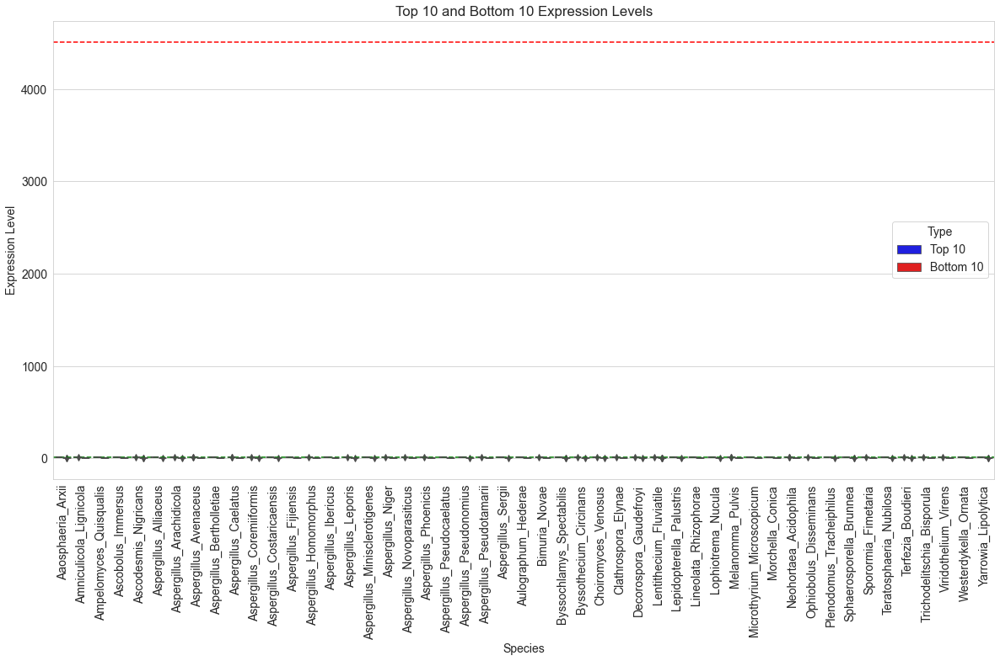

In [618]:
from scipy import special
# Get the min and max of sc_gfp_data
sc_gfp_data = df_gfp.ypred_gfptag_tpm.values
min_sc_gfp_data = np.min(sc_gfp_data)
max_sc_gfp_data = np.max(sc_gfp_data)

# Proceed as before up to the plotting part

# In your boxplot calls, add horizontal lines representing min_sc_gfp_data and max_sc_gfp_data
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_top_10_expr_long)
plt.axhline(y=min_sc_gfp_data, color='g', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.xticks(rotation=90)
plt.title('Top 10 Expression Levels')
plt.show()

plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_bottom_10_expr_long)
plt.axhline(y=min_sc_gfp_data, color='g', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.xticks(rotation=90)
plt.title('Bottom 10 Expression Levels')
plt.show()

plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Type', data=df_combined, palette=['blue', 'red'])
plt.axhline(y=min_sc_gfp_data, color='g', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.xticks(rotation=90)
plt.title('Top 10 and Bottom 10 Expression Levels')
plt.show()


In [619]:
# Fetch the data
saccharomyces_data = sc_gfp_data

# Compute the quantiles
top_10_percent = np.percentile(saccharomyces_data, 90)
bottom_10_percent = np.percentile(saccharomyces_data, 10)

# Find the values in the top and bottom 10%
top_10_percent_values = saccharomyces_data[saccharomyces_data >= top_10_percent]
bottom_10_percent_values = saccharomyces_data[saccharomyces_data <= bottom_10_percent]

# Compute the statistics
top_10_percent_average = np.mean(top_10_percent_values)
bottom_10_percent_average = np.mean(bottom_10_percent_values)
top_10_percent_median = np.median(top_10_percent_values)
bottom_10_percent_median = np.median(bottom_10_percent_values)

print(f"Top 10% average: {top_10_percent_average}")
print(f"Bottom 10% average: {bottom_10_percent_average}")
print(f"Top 10% median: {top_10_percent_median}")
print(f"Bottom 10% median: {bottom_10_percent_median}")

Top 10% average: 271.06054099476444
Bottom 10% average: 44.699173180628264
Top 10% median: 216.467245
Bottom 10% median: 47.4147895


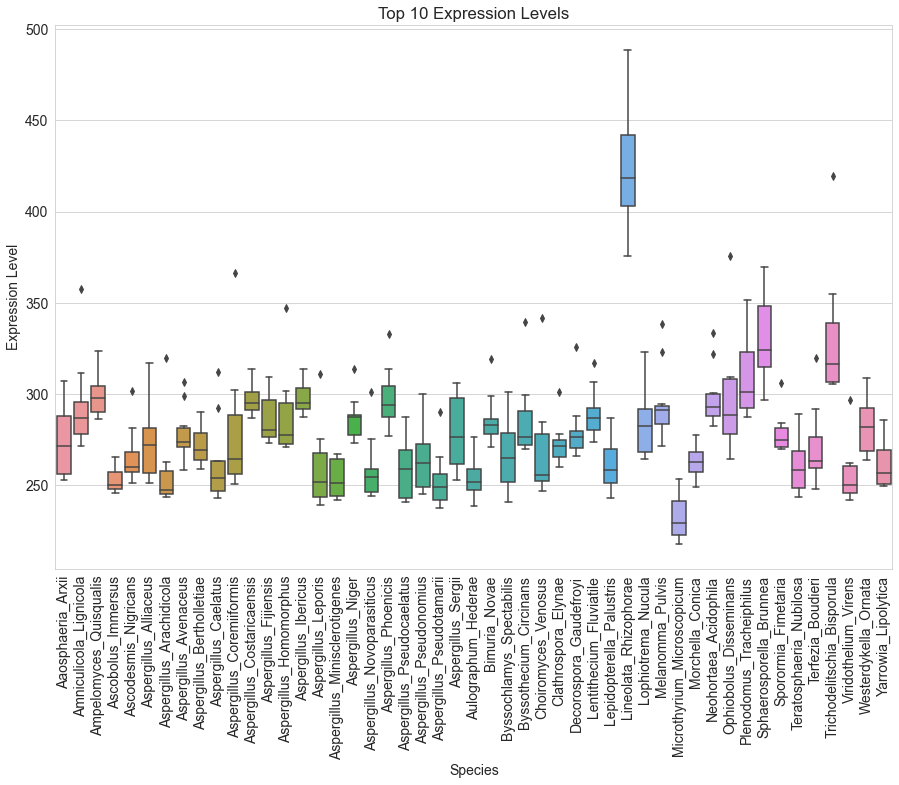

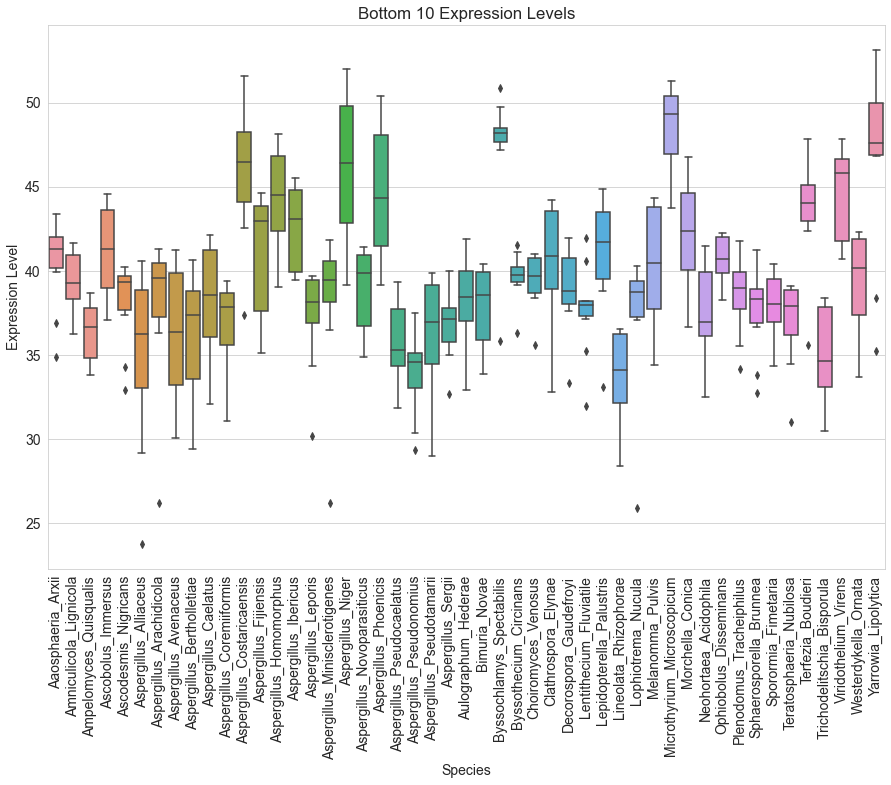

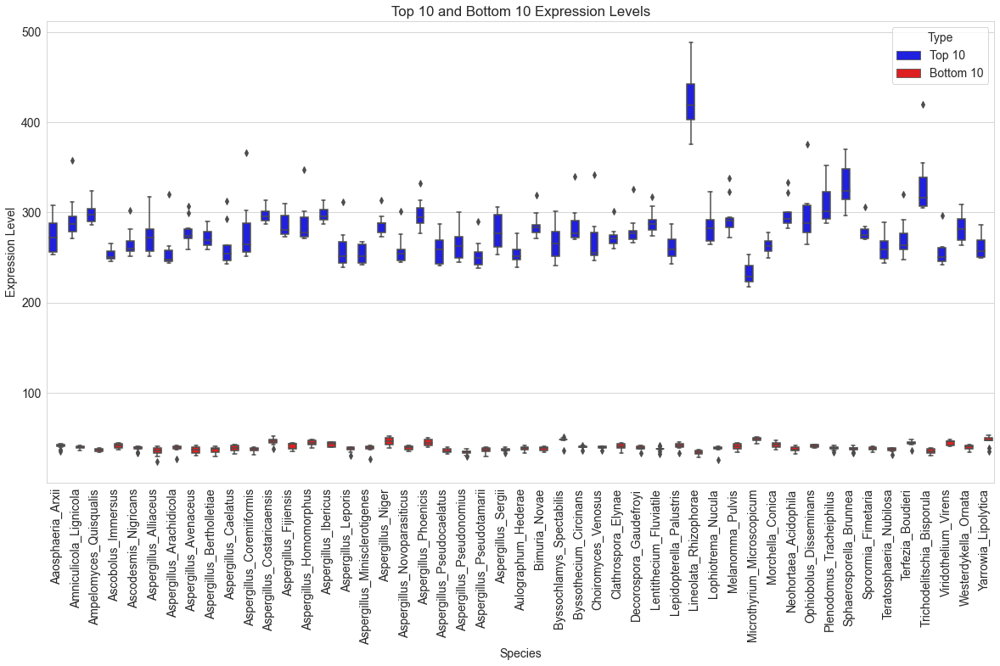

In [620]:
# Create the boxplots
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_top_10_expr_long)
plt.xticks(rotation=90)
plt.title('Top 10 Expression Levels')
plt.show()

plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_bottom_10_expr_long)
plt.xticks(rotation=90)
plt.title('Bottom 10 Expression Levels')
plt.show()

# Create a 'Type' column to distinguish between top 10 and bottom 10
df_top_10_expr_long['Type'] = 'Top 10'
df_bottom_10_expr_long['Type'] = 'Bottom 10'

# Combine the two DataFrames
df_combined = pd.concat([df_top_10_expr_long, df_bottom_10_expr_long])

# Create the combined boxplot
plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Type', data=df_combined, palette=['blue', 'red'])
plt.xticks(rotation=90)
plt.title('Top 10 and Bottom 10 Expression Levels')
plt.show()

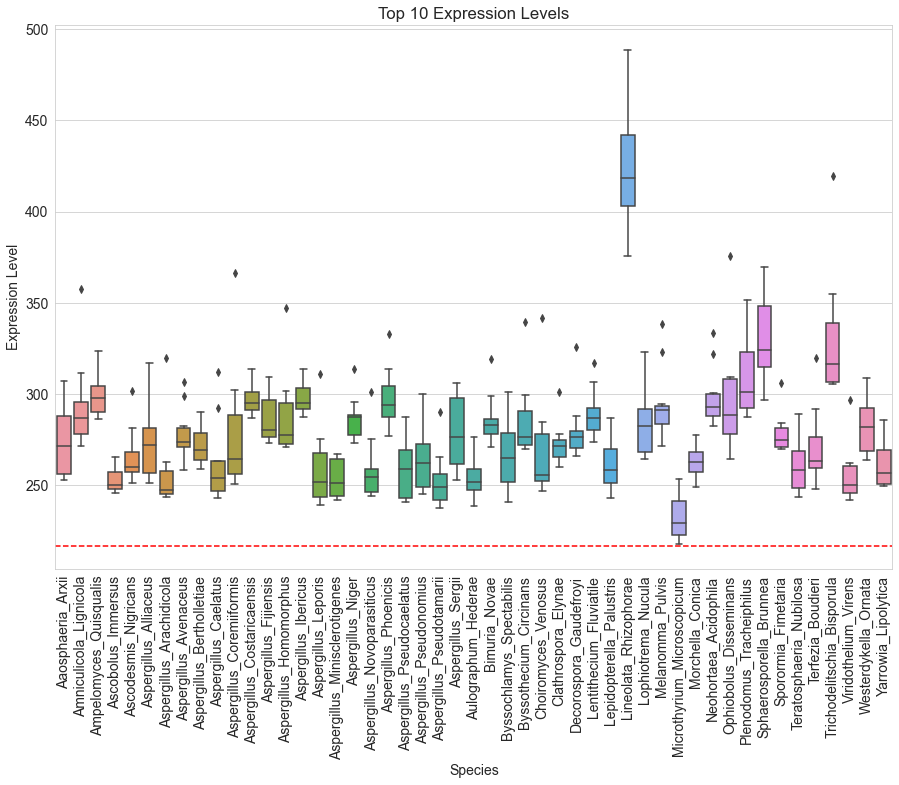

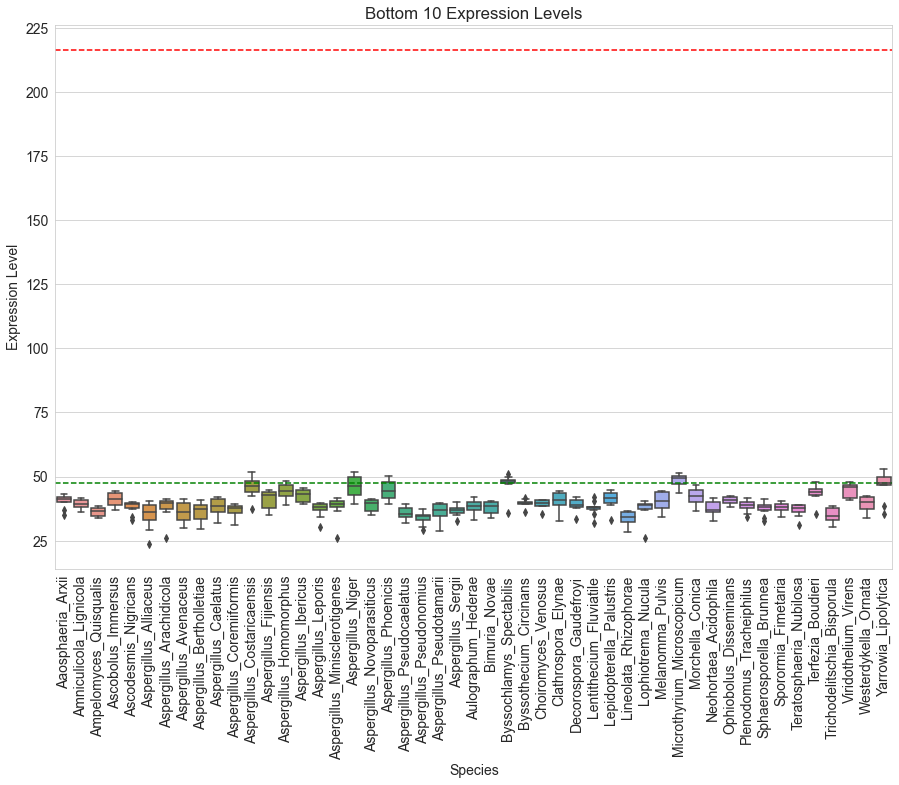

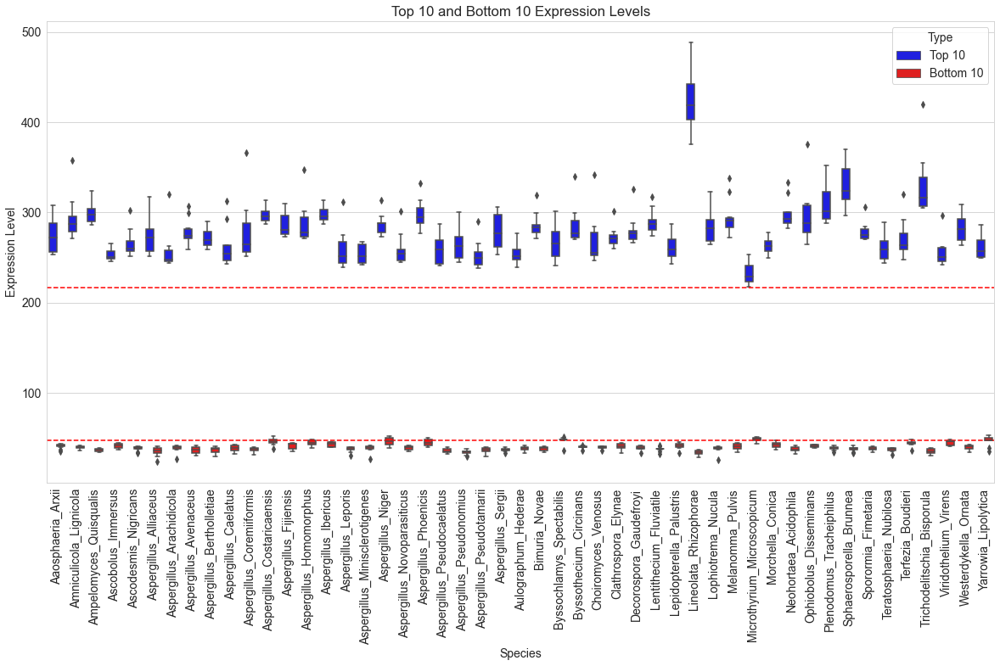

In [621]:
from scipy import special
# Get the min and max of sc_gfp_data
min_sc_gfp_data = bottom_10_percent_median
max_sc_gfp_data = top_10_percent_median

# Proceed as before up to the plotting part

# In your boxplot calls, add horizontal lines representing min_sc_gfp_data and max_sc_gfp_data
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_top_10_expr_long)
plt.axhline(y=top_10_percent_median, color='r', linestyle='--')
plt.xticks(rotation=90)
plt.title('Top 10 Expression Levels')
plt.show()

plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_bottom_10_expr_long)
plt.axhline(y=min_sc_gfp_data, color='g', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.xticks(rotation=90)
plt.title('Bottom 10 Expression Levels')
plt.show()

plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Type', data=df_combined, palette=['blue', 'red'])
plt.axhline(y=min_sc_gfp_data, color='r', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.xticks(rotation=90)
plt.title('Top 10 and Bottom 10 Expression Levels')
plt.show()

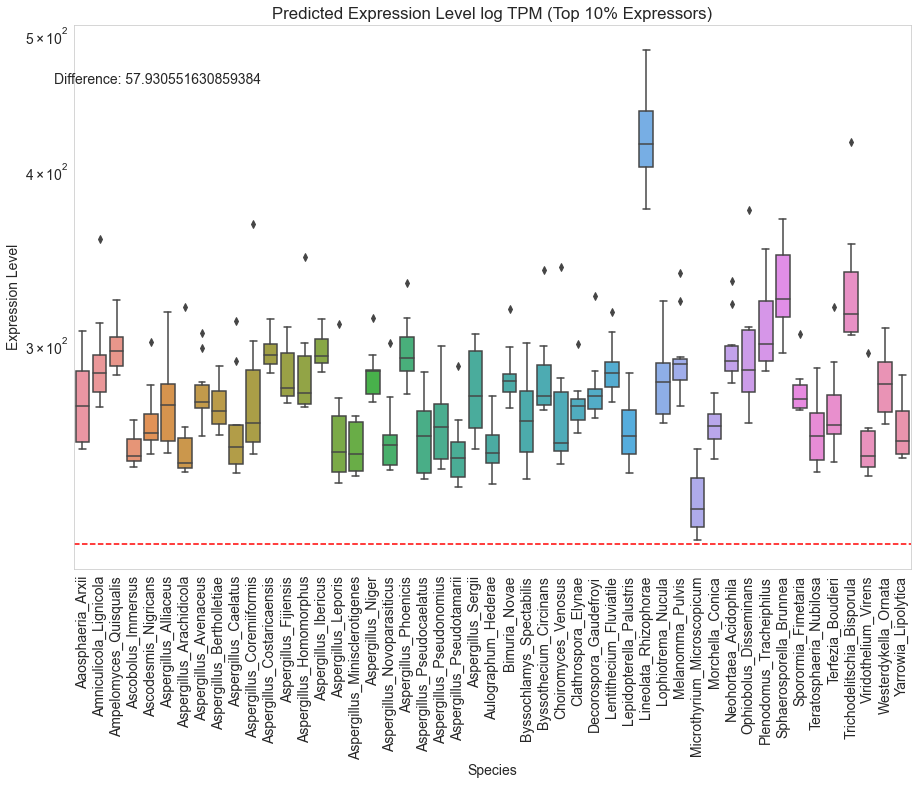

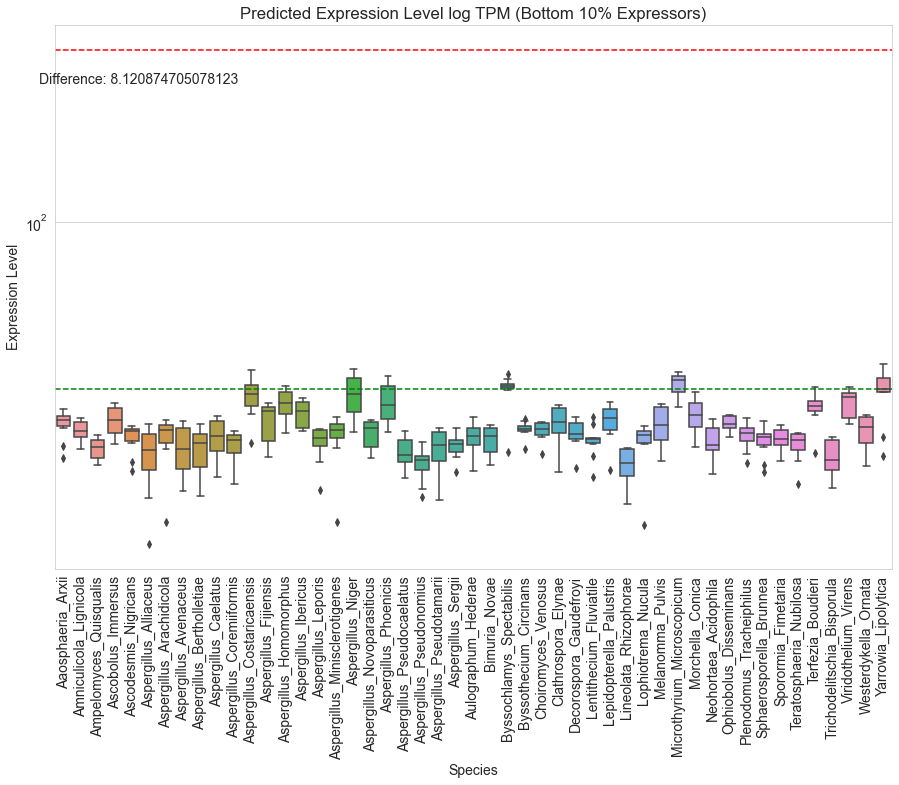

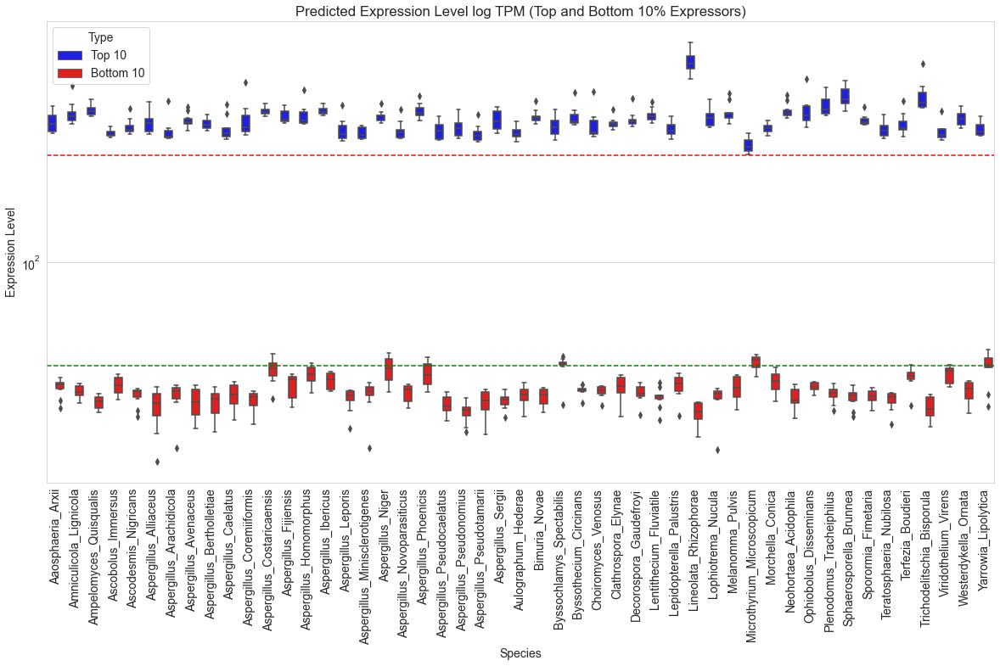

In [622]:
# Get the median of the top 10% and bottom 10% expressors
median_top_10_expressors = df_top_10_expr_long['Expression Level'].median()
median_bottom_10_expressors = df_bottom_10_expr_long['Expression Level'].median()

# Calculate the differences
diff_top = median_top_10_expressors - top_10_percent_median
diff_bottom = bottom_10_percent_median - median_bottom_10_expressors

# Plot the top 10% expressors
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_top_10_expr_long)
plt.axhline(y=top_10_percent_median, color='r', linestyle='--')
plt.yscale('log')
plt.text(0.1, 0.9, f"Difference: {diff_top}", ha='center', va='center', transform=plt.gca().transAxes)
plt.xticks(rotation=90)
plt.title('Predicted Expression Level log TPM (Top 10% Expressors)')
plt.show()

# Plot the bottom 10% expressors
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_bottom_10_expr_long)
plt.axhline(y=min_sc_gfp_data, color='g', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.text(0.1, 0.9, f"Difference: {diff_bottom}", ha='center', va='center', transform=plt.gca().transAxes)
plt.xticks(rotation=90)
plt.title('Predicted Expression Level log TPM (Bottom 10% Expressors)')
plt.show()

# Plot both top and bottom 10% expressors
plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Type', data=df_combined, palette=['blue', 'red'])
plt.axhline(y=min_sc_gfp_data, color='g', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.xticks(rotation=90)
plt.title('Predicted Expression Level log TPM (Top and Bottom 10% Expressors)')
plt.show()


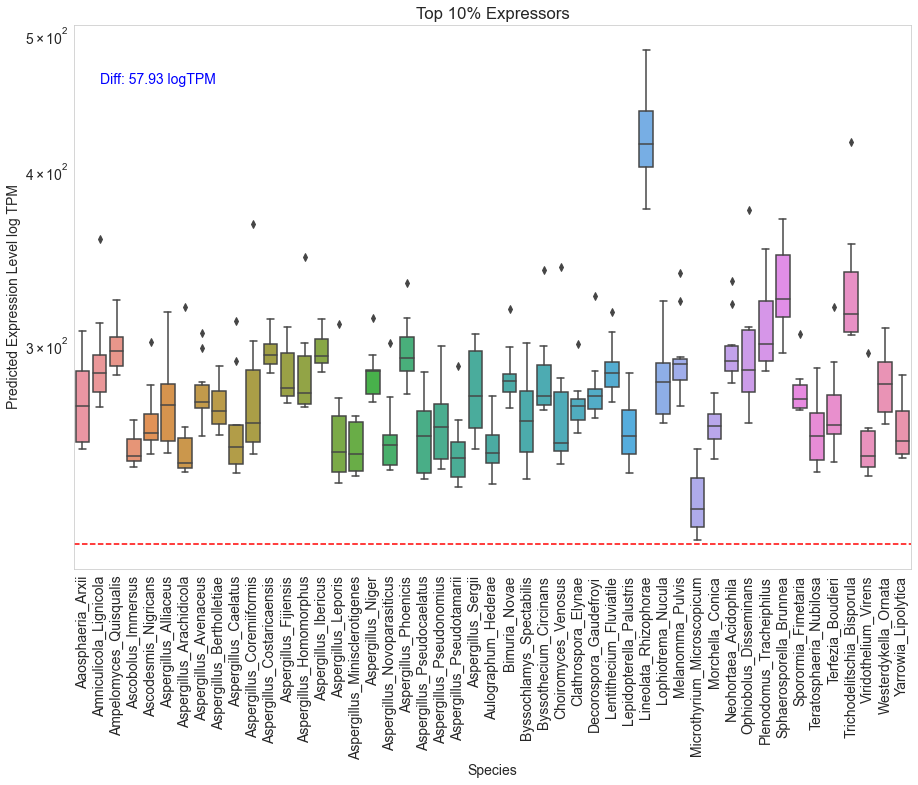

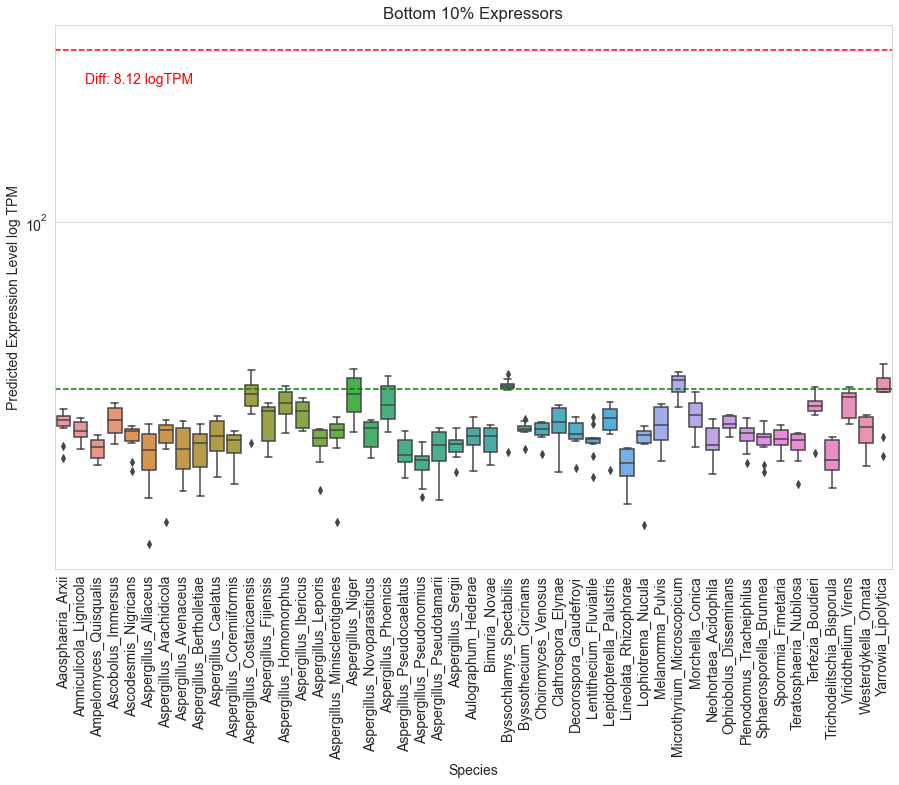

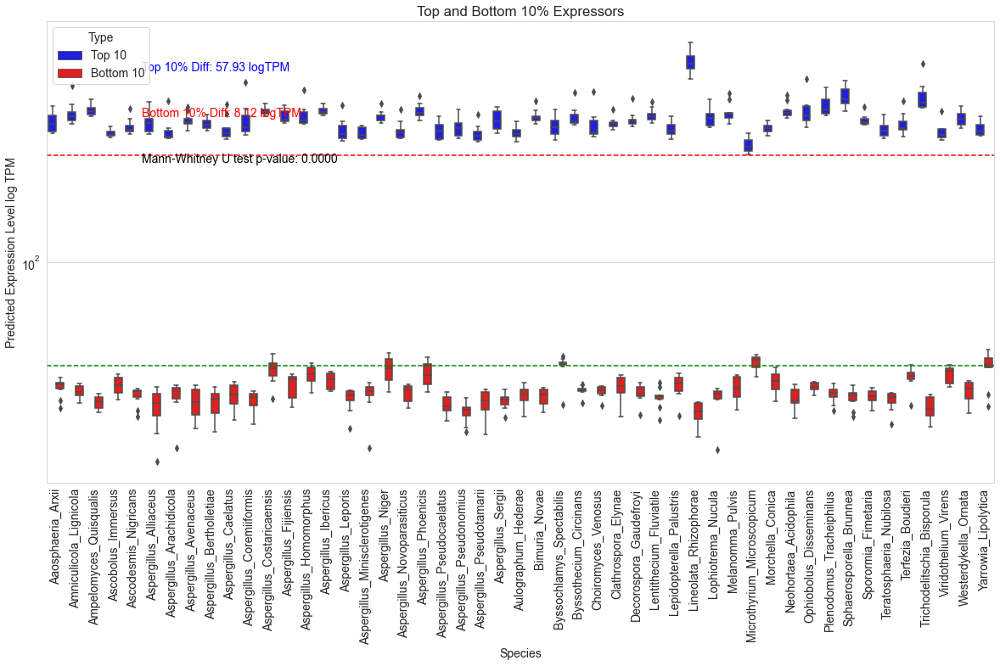

In [623]:
import scipy.stats as stats

# Calculate Mann-Whitney U test
U_statistic, p_val = stats.mannwhitneyu(df_top_10_expr_long['Expression Level'], 
                                        df_bottom_10_expr_long['Expression Level'])

# Plot the top 10% expressors
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_top_10_expr_long)
plt.axhline(y=top_10_percent_median, color='r', linestyle='--')
plt.yscale('log')
plt.text(0.1, 0.9, f"Diff: {diff_top:.2f} logTPM", ha='center', va='center', transform=plt.gca().transAxes, color='blue')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.title('Top 10% Expressors')
plt.show()

# Plot the bottom 10% expressors
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_bottom_10_expr_long)
plt.axhline(y=min_sc_gfp_data, color='g', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.text(0.1, 0.9, f"Diff: {diff_bottom:.2f} logTPM", ha='center', va='center', transform=plt.gca().transAxes, color='red')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.title('Bottom 10% Expressors')
plt.show()

# Plot both top and bottom 10% expressors
plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Type', data=df_combined, palette=['blue', 'red'])
plt.axhline(y=min_sc_gfp_data, color='g', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.text(0.1, 0.9, f"Top 10% Diff: {diff_top:.2f} logTPM", ha='left', va='center', transform=plt.gca().transAxes, color='blue')
plt.text(0.1, 0.8, f"Bottom 10% Diff: {diff_bottom:.2f} logTPM", ha='left', va='center', transform=plt.gca().transAxes, color='red')
plt.text(0.1, 0.7, f"Mann-Whitney U test p-value: {p_val:.4f}", ha='left', va='center', transform=plt.gca().transAxes, color='black')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.title('Top and Bottom 10% Expressors')
plt.show()


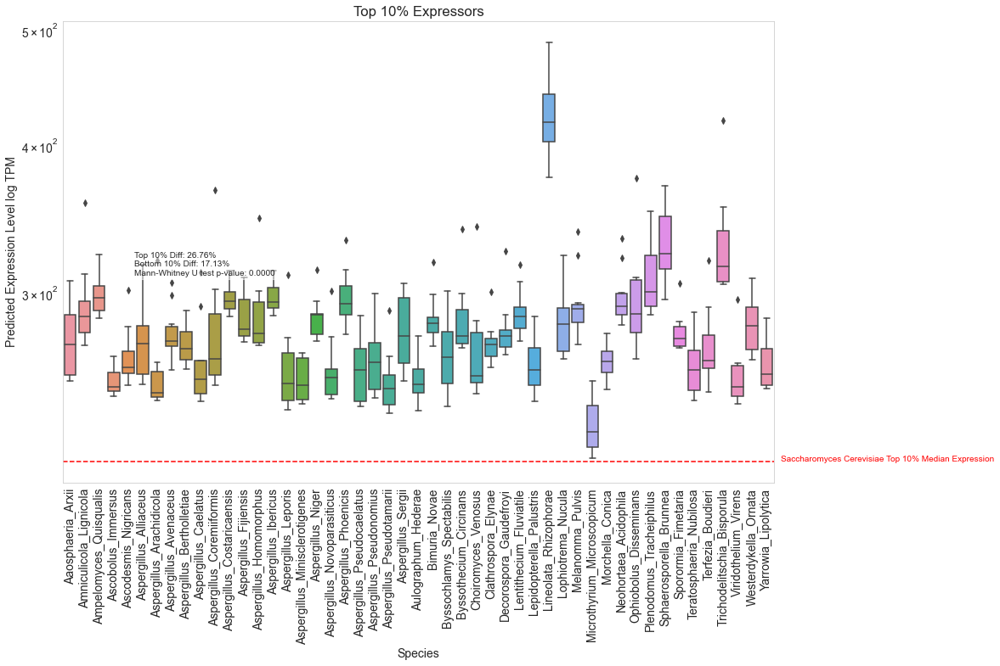

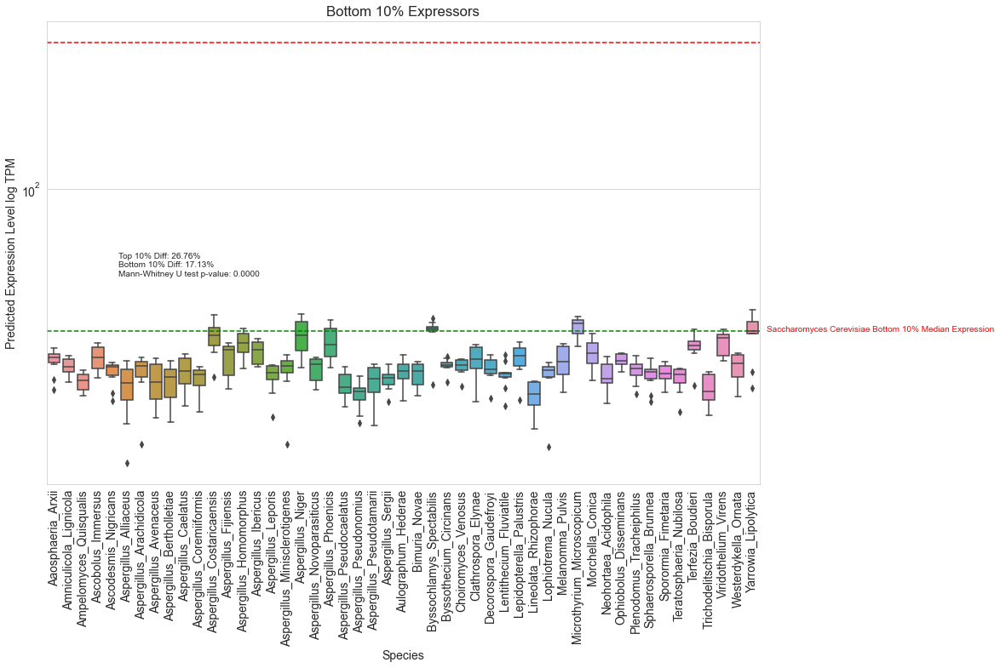

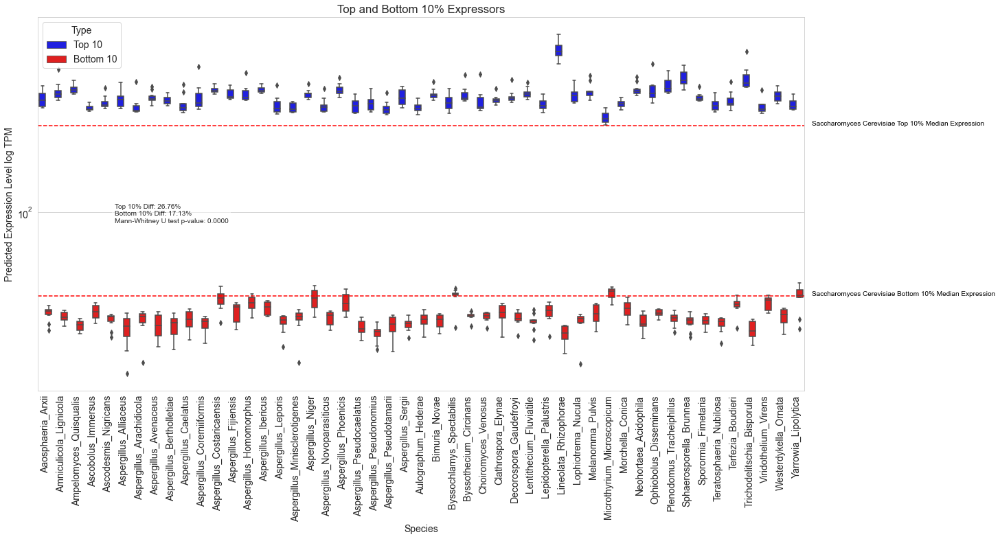

In [624]:
import scipy.stats as stats

# Calculate Mann-Whitney U test
U_statistic, p_val = stats.mannwhitneyu(df_top_10_expr_long['Expression Level'], 
                                        df_bottom_10_expr_long['Expression Level'])
U_statistic1, p_val1 = stats.mannwhitneyu(df_top_10_expr_long['Expression Level'], 
                                        df_bottom_10_expr_long['Expression Level'])

# Calculate percentage differences
diff_top_percent = (diff_top / ((top_10_percent_median + max_sc_gfp_data) / 2)) * 100
diff_bottom_percent = (diff_bottom / ((bottom_10_percent_median + min_sc_gfp_data) / 2)) * 100

# Create a text box for statistics
textstr = '\n'.join((
    f"Top 10% Diff: {diff_top_percent:.2f}%",
    f"Bottom 10% Diff: {diff_bottom_percent:.2f}%",
    f"Mann-Whitney U test p-value: {p_val:.4f}"))

# Plot the top 10% expressors
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_top_10_expr_long)
plt.axhline(y=top_10_percent_median, color='r', linestyle='--')
plt.yscale('log')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.title('Top 10% Expressors')

# Add label for the line
plt.text(len(df_top_10_expr_long['Species'].unique()), top_10_percent_median, 'Saccharomyces Cerevisiae Top 10% Median Expression',
         horizontalalignment='left', color='red', fontsize=10)

plt.text(0.1, 0.5, textstr, transform=plt.gca().transAxes, fontsize=10,
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
plt.show()

# Plot the bottom 10% expressors
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_bottom_10_expr_long)
plt.axhline(y=min_sc_gfp_data, color='g', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.title('Bottom 10% Expressors')

# Add label for the line
plt.text(len(df_bottom_10_expr_long['Species'].unique()), min_sc_gfp_data, 'Saccharomyces Cerevisiae Bottom 10% Median Expression',
         horizontalalignment='left', color='red', fontsize=10)

plt.text(0.1, 0.5, textstr, transform=plt.gca().transAxes, fontsize=10,
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
plt.show()

# Plot both top and bottom 10% expressors
plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Type', data=df_combined, palette=['blue', 'red'])
plt.axhline(y=min_sc_gfp_data, color='r', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.title('Top and Bottom 10% Expressors')

# Add labels for the lines
plt.text(len(df_combined['Species'].unique()), top_10_percent_median, 'Saccharomyces Cerevisiae Top 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)
plt.text(len(df_combined['Species'].unique()), min_sc_gfp_data, 'Saccharomyces Cerevisiae Bottom 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)

plt.text(0.1, 0.5, textstr, transform=plt.gca().transAxes, fontsize=10,
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
plt.show()


In [625]:
pred_file = r"D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_permutate/Permutated_Up_Pred.npy"
permutate_top_pred_array = np.load(pred_file)
permutate_top_pred_array = permutate_top_pred_array.flatten()

pred_file = r"D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_permutate/Permutated_Down_Pred.npy"
permutate_bot_pred_array = np.load(pred_file)
permutate_bot_pred_array = permutate_bot_pred_array.flatten()

In [626]:
species_rows_file = 'D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/data_combined_df_output/expression_species_rows.csv'
species_rows_df = pd.read_csv(species_rows_file)

# Read the species data
df_species = pd.read_csv(species_rows_file, header=None)
species_names = df_species[0].unique()

# Create a dictionary using species names as keys and data points as values
native_pred_dict = {}
for species in species_rows_df.columns[:]: 
    indices = species_rows_df[species]
    # Remove NaNs, negative values, and convert to integer
    indices = indices[indices >= 0].dropna().astype(int)
    # Make sure indices are within the length of pred_array
    indices = indices[indices < len(pred_array)]
    
    # Split the species name by "_" and take the first two parts
    name_parts = species.split("_")[:2]
    # Capitalize the second part
    name_parts[1] = name_parts[1].capitalize()
    # Join them back together
    new_species = "_".join(name_parts)

    native_pred_dict[new_species] = pred_array[indices]

# Extract species names
species_names = list(native_pred_dict.keys())


In [627]:

# Split the arrays into chunks for bottom expression
chunks_bot = np.split(permutate_bot_pred_array, np.arange(100, len(permutate_bot_pred_array), 100))

# Create a DataFrame for bottom expression
df_bot_expression_perm = pd.DataFrame([(species, value) for species, chunk_bot in zip(species_names, chunks_bot) for value in chunk_bot],
                                 columns=['Species', 'Expression Level'])

# For top_expression_dict, split up until 4700
chunks_top_pre_4700 = np.split(permutate_top_pred_array[:4700], np.arange(100, 4700, 100))

# Manually add on the next 90 values
chunk_top_4700_4790 = permutate_top_pred_array[4700:4790]

# Chunk split the from 4790 onwards again
chunks_top_post_4790 = np.split(permutate_top_pred_array[4790:], np.arange(100, len(permutate_top_pred_array[4790:]), 100))

# Combine all chunks
chunks_top = chunks_top_pre_4700 + [chunk_top_4700_4790] + chunks_top_post_4790

# Create a DataFrame for top expression
df_top_expression_perm = pd.DataFrame([(species, value) for species, chunk_top in zip(species_names, chunks_top) for value in chunk_top],
                                 columns=['Species', 'Expression Level'])


In [628]:
# Keep top 10 lowest values for df_bot_expression
df_bot_expression_perm = df_bot_expression_perm.groupby('Species')['Expression Level'].nsmallest(10).reset_index()

# Keep top 10 largest values for df_top_expression
df_top_expression_perm = df_top_expression_perm.groupby('Species')['Expression Level'].nlargest(10).reset_index()


In [629]:
print(df_bot_expression_perm)

                 Species  level_1  Expression Level
0      Aaosphaeria_Arxii        4          4.957263
1      Aaosphaeria_Arxii       84          5.021527
2      Aaosphaeria_Arxii       14          5.087754
3      Aaosphaeria_Arxii       24          5.092064
4      Aaosphaeria_Arxii       54          5.097942
..                   ...      ...               ...
485  Yarrowia_Lipolytica     4831          4.842812
486  Yarrowia_Lipolytica     4891          4.858356
487  Yarrowia_Lipolytica     4871          4.880710
488  Yarrowia_Lipolytica     4820          5.248257
489  Yarrowia_Lipolytica     4850          5.336523

[490 rows x 3 columns]


In [630]:
df_top_10_expr_long_perm = df_top_expression_perm
df_bottom_10_expr_long_perm = df_bot_expression_perm
# Apply the boxcox transformation to your dataframes
df_top_10_expr_long_perm['Expression Level'] = boxtpm(df_top_expression_perm['Expression Level'], lmbda)
df_bottom_10_expr_long_perm['Expression Level'] = boxtpm(df_bot_expression_perm['Expression Level'], lmbda)

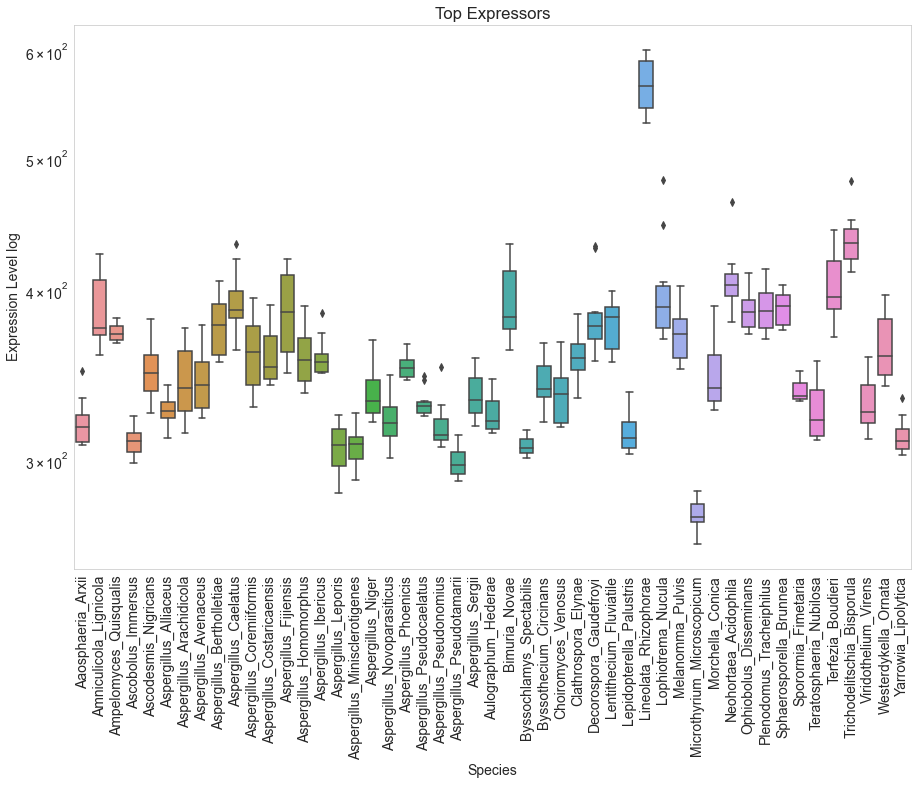

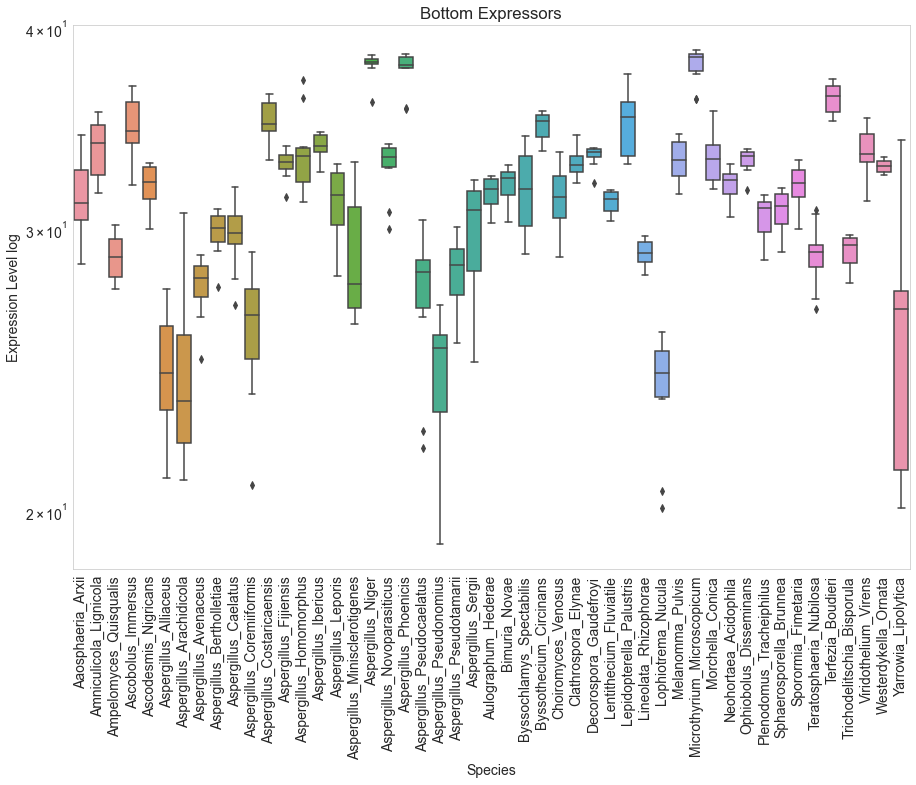

In [631]:
# Plot the top expressors
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_top_expression_perm)
plt.yscale('log')
plt.ylabel('Expression Level log')
plt.xticks(rotation=90)
plt.title('Top Expressors')
plt.show()

# Plot the bottom expressors
plt.figure(figsize=(15, 10))
sns.boxplot(x='Species', y='Expression Level', data=df_bot_expression_perm)
plt.yscale('log')
plt.ylabel('Expression Level log')
plt.xticks(rotation=90)
plt.title('Bottom Expressors')
plt.show()

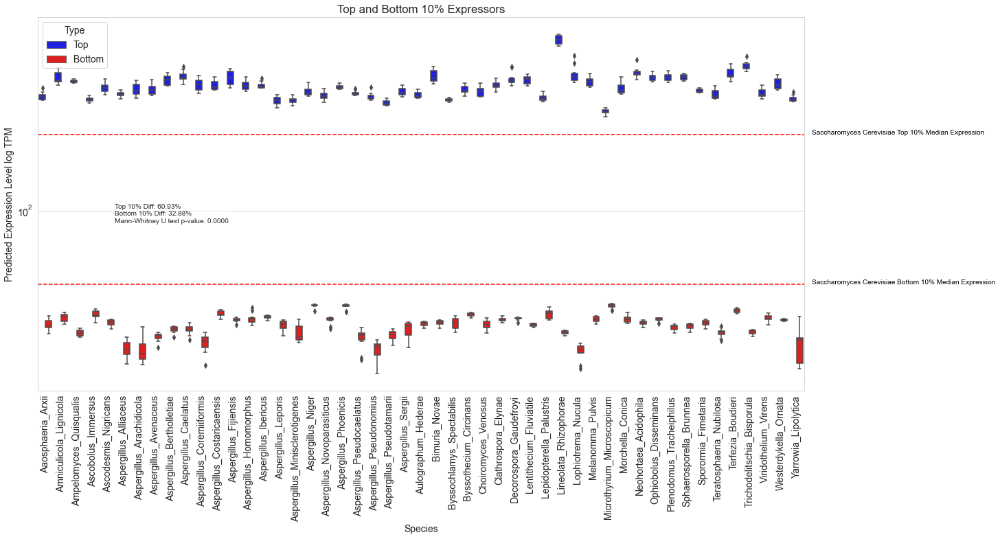

In [632]:
# Calculate the median of the top 10% and bottom 10% expressors
median_top_10_expressors = df_top_expression_perm['Expression Level'].median()
median_bottom_10_expressors = df_bot_expression_perm['Expression Level'].median()

# Calculate the differences
diff_top = median_top_10_expressors - top_10_percent_median
diff_bottom = bottom_10_percent_median - median_bottom_10_expressors

# Add a new column to both dataframes indicating whether they're from top or bottom expressors
df_top_expression_perm['Type'] = 'Top'
df_bot_expression_perm['Type'] = 'Bottom'

# Concatenate the two dataframes
df_combined = pd.concat([df_top_expression_perm, df_bot_expression_perm])

# Calculate Mann-Whitney U test
U_statistic, p_val = stats.mannwhitneyu(df_top_expression_perm['Expression Level'], 
                                        df_bot_expression_perm['Expression Level'])

# Calculate percentage differences
diff_top_percent = (diff_top / ((top_10_percent_median + max_sc_gfp_data) / 2)) * 100
diff_bottom_percent = (diff_bottom / ((bottom_10_percent_median + min_sc_gfp_data) / 2)) * 100

# Create a text box for statistics
textstr = '\n'.join((
    f"Top 10% Diff: {diff_top_percent:.2f}%",
    f"Bottom 10% Diff: {diff_bottom_percent:.2f}%",
    f"Mann-Whitney U test p-value: {p_val:.4f}"))

# Plot both top and bottom expressors on the same chart
plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Type', data=df_combined, palette=['blue', 'red'])
plt.axhline(y=min_sc_gfp_data, color='r', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.title('Top and Bottom 10% Expressors')

# Add labels for the lines
plt.text(len(df_combined['Species'].unique()), top_10_percent_median, 'Saccharomyces Cerevisiae Top 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)
plt.text(len(df_combined['Species'].unique()), min_sc_gfp_data, 'Saccharomyces Cerevisiae Bottom 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)

plt.text(0.1, 0.5, textstr, transform=plt.gca().transAxes, fontsize=10,
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
plt.show()


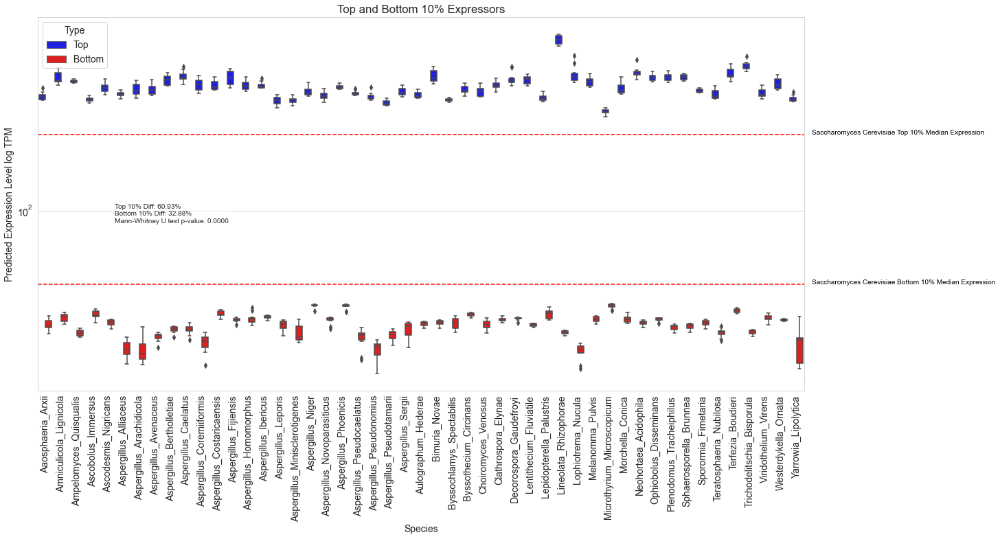

In [633]:
# Calculate the median of the top 10% and bottom 10% expressors
median_top_10_expressors_perm = df_top_expression_perm['Expression Level'].median()
median_bottom_10_expressors_perm = df_bot_expression_perm['Expression Level'].median()

# Calculate the differences
diff_top_perm = median_top_10_expressors_perm - top_10_percent_median
diff_bottom_perm = bottom_10_percent_median - median_bottom_10_expressors_perm

# Calculate percentage differences
diff_top_percent_perm = (diff_top_perm / ((top_10_percent_median + max_sc_gfp_data) / 2)) * 100
diff_bottom_percent_perm = (diff_bottom_perm / ((bottom_10_percent_median + min_sc_gfp_data) / 2)) * 100

# Calculate Mann-Whitney U test for permutated data
U_statistic_perm, p_val_perm = stats.mannwhitneyu(df_top_expression_perm['Expression Level'], 
                                        df_bot_expression_perm['Expression Level'])

# Calculate Mann-Whitney U test for long format data
U_statistic_long, p_val_long = stats.mannwhitneyu(df_top_10_expr_long['Expression Level'], 
                                        df_bottom_10_expr_long['Expression Level'])

# Create a text box for statistics
'''
textstr = '\n'.join((
    f"Statistics of the Permutated top Up and Down Regulator Sequences versus Sacc.Cere.:",
    f"Top 10% Diff: {diff_top_percent_perm:.2f}%",
    f"Bottom 10% Diff: {diff_bottom_percent_perm:.2f}%",
    f"Mann-Whitney U test p-value: {p_val_perm:.4f}",
    "----------",
    f"Statistics of the top Up and Down Regulator Sequences versus Sacc.Cere.",
    f"Top 10% Diff: {diff_top_percent:.2f}%",
    f"Bottom 10% Diff: {diff_bottom_percent:.2f}%",
    f"Mann-Whitney U test p-value: {p_val_long:.4f}"))
'''
# Plot both top and bottom expressors on the same chart
plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Type', data=df_combined, palette=['blue', 'red'])
plt.axhline(y=min_sc_gfp_data, color='r', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.title('Top and Bottom 10% Expressors')

# Add labels for the lines
plt.text(len(df_combined['Species'].unique()), top_10_percent_median, 'Saccharomyces Cerevisiae Top 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)
plt.text(len(df_combined['Species'].unique()), min_sc_gfp_data, 'Saccharomyces Cerevisiae Bottom 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)

plt.text(0.1, 0.5, textstr, transform=plt.gca().transAxes, fontsize=10,
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
plt.show()


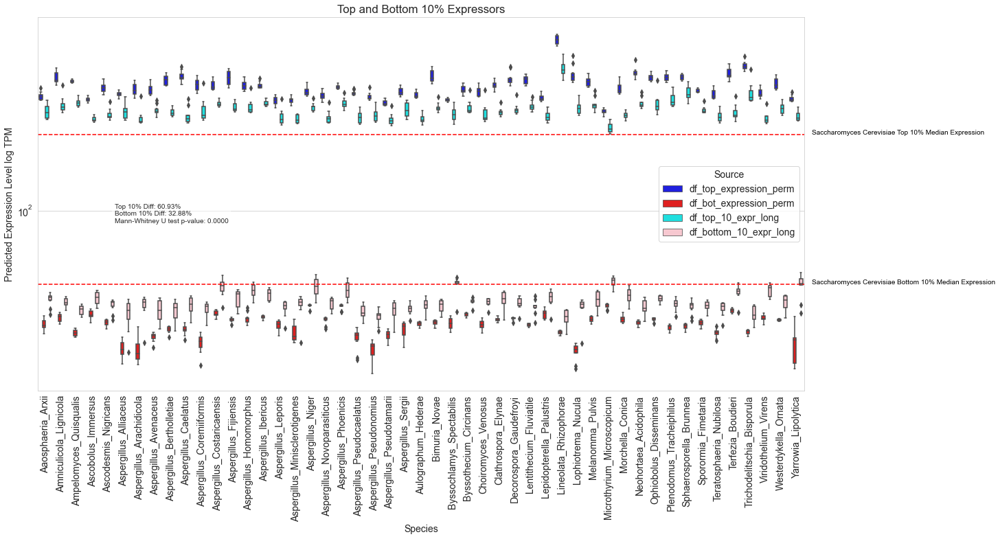

In [634]:
# Add a new column to all dataframes indicating the source dataframe
df_top_expression_perm['Source'] = 'df_top_expression_perm'
df_bot_expression_perm['Source'] = 'df_bot_expression_perm'
df_top_10_expr_long['Source'] = 'df_top_10_expr_long'
df_bottom_10_expr_long['Source'] = 'df_bottom_10_expr_long'

# Concatenate all four dataframes
df_all = pd.concat([df_top_expression_perm, df_bot_expression_perm, df_top_10_expr_long, df_bottom_10_expr_long])

# Plot the combined dataframe
plt.figure(figsize=(20, 10))
sns.boxplot(x='Species', y='Expression Level', hue='Source', data=df_all, 
            palette={'df_top_expression_perm': 'blue', 'df_bot_expression_perm': 'red', 'df_top_10_expr_long': 'cyan', 'df_bottom_10_expr_long': 'pink'})
plt.axhline(y=min_sc_gfp_data, color='r', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.title('Top and Bottom 10% Expressors')

# Add labels for the lines
plt.text(len(df_all['Species'].unique()), top_10_percent_median, 'Saccharomyces Cerevisiae Top 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)
plt.text(len(df_all['Species'].unique()), min_sc_gfp_data, 'Saccharomyces Cerevisiae Bottom 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)

plt.text(0.1, 0.5, textstr, transform=plt.gca().transAxes, fontsize=10,
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))
plt.show()


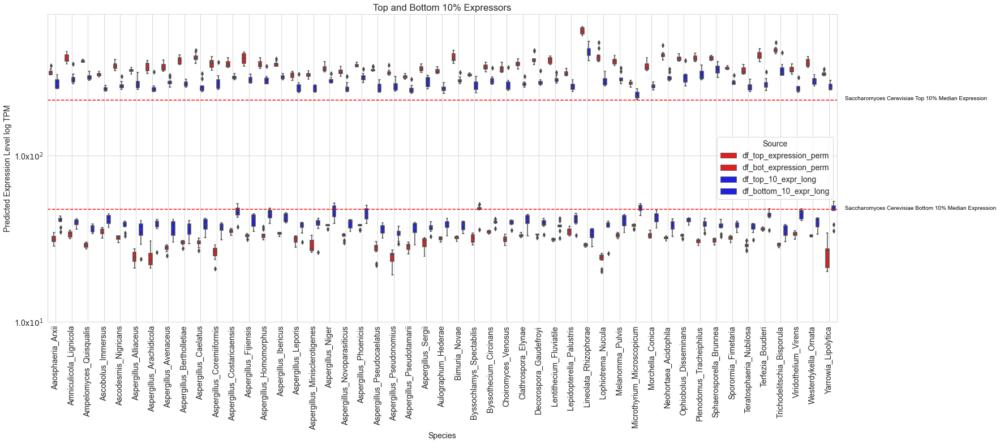

,Species,Top 10% Expression Difference,Bottom 10% Expression Difference
0,Aaosphaeria_Arxii,15.590988,28.024695
1,Amniculicola_Lignicola,26.725901,14.559659
2,Ampelomyces_Quisqualis,22.105513,23.950812
3,Ascobolus_Immersus,21.377333,17.694208
4,Ascodesmis_Nigricans,28.925028,20.188501
5,Aspergillus_Alliaceus,18.138276,38.984164
6,Aspergillus_Arachidicola,31.278688,51.172240
7,Aspergillus_Avenaceus,21.810983,26.080493
8,Aspergillus_Bertholletiae,33.430134,21.645353
9,Aspergillus_Caelatus,41.443299,25.504656


In [635]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# A function to format y-axis ticks
def y_fmt(x, pos):
    return '{:0.1f}x$10^{}$'.format(x * 10 ** -np.floor(np.log10(x)), int(np.floor(np.log10(x))))

# Create an empty DataFrame to store overall percentage difference for all species
percentage_diff_all_species = pd.DataFrame(columns=['Species', 'Top 10% Expression Difference', 'Bottom 10% Expression Difference'])

species_list = df_all['Species'].unique().tolist()
plt.figure(figsize=(25, 10))  
sns.boxplot(x='Species', y='Expression Level', hue='Source', data=df_all, 
            palette={'df_top_expression_perm': 'red', 'df_bot_expression_perm': 'red', 'df_top_10_expr_long': 'blue', 'df_bottom_10_expr_long': 'blue'},
            hue_order=['df_top_expression_perm', 'df_bot_expression_perm', 'df_top_10_expr_long', 'df_bottom_10_expr_long'])

plt.axhline(y=min_sc_gfp_data, color='r', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.ylabel('Predicted Expression Level log TPM')
plt.xticks(rotation=90)
plt.yticks(10**np.arange(np.floor(np.log10(df_all['Expression Level'].min())), np.ceil(np.log10(df_all['Expression Level'].max()))))  
plt.gca().get_yaxis().set_major_formatter(FuncFormatter(y_fmt))  # Use the custom formatter for y-axis
plt.title('Top and Bottom 10% Expressors')
plt.grid(True)

for species in species_list:
    top_perm = df_all[(df_all['Species'] == species) & (df_all['Source'] == 'df_top_expression_perm')]['Expression Level']
    top_long = df_all[(df_all['Species'] == species) & (df_all['Source'] == 'df_top_10_expr_long')]['Expression Level']
    bottom_perm = df_all[(df_all['Species'] == species) & (df_all['Source'] == 'df_bot_expression_perm')]['Expression Level']
    bottom_long = df_all[(df_all['Species'] == species) & (df_all['Source'] == 'df_bottom_10_expr_long')]['Expression Level']

    # Calculate percentage difference
    top_diff = (top_perm.median() - top_long.median()) / ((top_perm.median() + top_long.median()) / 2) * 100
    bottom_diff = (bottom_perm.median() - bottom_long.median()) / ((bottom_perm.median() + bottom_long.median()) / 2) * 100

    # Append to the DataFrame
    percentage_diff_all_species = percentage_diff_all_species.append({
        'Species': species, 
        'Top 10% Expression Difference': top_diff, 
        'Bottom 10% Expression Difference': -bottom_diff}, ignore_index=True)
    
# Add labels for the lines
plt.text(len(df_all['Species'].unique()), top_10_percent_median, 'Saccharomyces Cerevisiae Top 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)
plt.text(len(df_all['Species'].unique()), min_sc_gfp_data, 'Saccharomyces Cerevisiae Bottom 10% Median Expression',
         horizontalalignment='left', color='black', fontsize=10)
    # Add annotations
    #if top_perm.any() and top_long.any():
        #plt.text(species_list.index(species) - 0.2, top_perm.median(), f"{top_diff:.2f}%", horizontalalignment='center')
    #if bottom_perm.any() and bottom_long.any():
        #plt.text(species_list.index(species) + 0.2, bottom_perm.median(), f"{bottom_diff:.2f}%", horizontalalignment='center')

plt.show()
percentage_diff_all_species


Species Min and Max TPM:
                          Species  df_bottom_10_expr_long_min  \
0               Aaosphaeria_Arxii                        28.6   
1          Amniculicola_Lignicola                        31.6   
2          Ampelomyces_Quisqualis                        27.5   
3              Ascobolus_Immersus                        32.0   
4            Ascodesmis_Nigricans                        30.0   
5           Aspergillus_Alliaceus                        21.0   
6        Aspergillus_Arachidicola                        20.9   
7           Aspergillus_Avenaceus                        24.9   
8       Aspergillus_Bertholletiae                        27.6   
9            Aspergillus_Caelatus                        26.9   
10      Aspergillus_Coremiiformis                        20.8   
11     Aspergillus_Costaricaensis                        33.1   
12          Aspergillus_Fijiensis                        31.4   
13        Aspergillus_Homomorphus                        31.2   


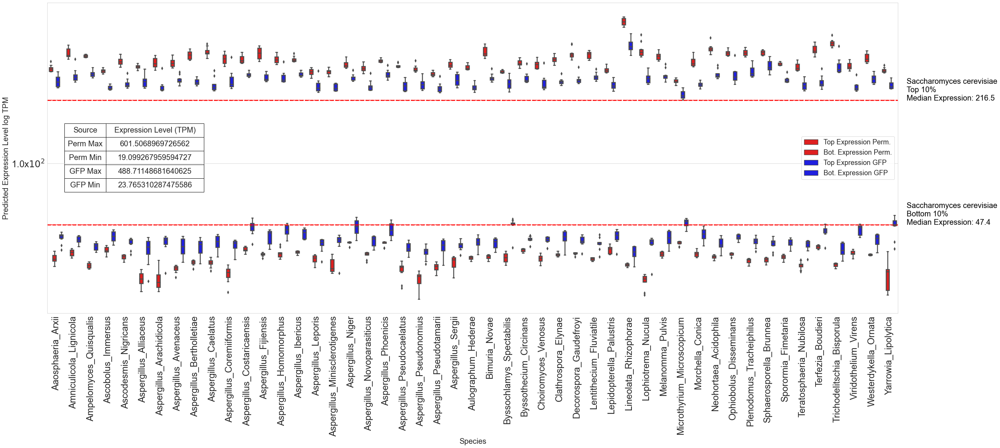

In [636]:
# A function to format y-axis ticks
def y_fmt(x, pos):
    return '{:0.1f}x$10^{}$'.format(x * 10 ** -np.floor(np.log10(x)), int(np.floor(np.log10(x))))

# Create an empty DataFrame to store overall percentage difference for all species
percentage_diff_all_species = pd.DataFrame(columns=['Species', 'Top 10% Expression Difference', 'Bottom 10% Expression Difference'])

species_list = df_all['Species'].unique().tolist()
plt.figure(figsize=(40, 15))  # Increase the size of the chart

#sns.boxplot(x='Species', y='Expression Level', hue='Source', data=df_all, 
#            palette={'df_top_expression_perm': 'red', 'df_bot_expression_perm': 'red', 'df_top_10_expr_long': 'blue', 'df_bottom_10_expr_long': 'blue'},
#            hue_order=['df_top_expression_perm', 'df_bot_expression_perm', 'df_top_10_expr_long', 'df_bottom_10_expr_long'])

plt.axhline(y=min_sc_gfp_data, color='r', linestyle='--')
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--')
plt.yscale('log')
plt.ylabel('Predicted Expression Level log TPM', fontsize=16)  # Increase text size
plt.xticks(rotation=90, fontsize=16)  # Increase text size
plt.yticks(10**np.arange(np.floor(np.log10(df_all['Expression Level'].min())), np.ceil(np.log10(df_all['Expression Level'].max()))))  
plt.gca().get_yaxis().set_major_formatter(FuncFormatter(y_fmt))  # Use the custom formatter for y-axis
plt.grid(True)

# Combine perm top and bottom data
perm_min = min(df_all[df_all['Source'] == 'df_top_expression_perm']['Expression Level'].min(),
               df_all[df_all['Source'] == 'df_bot_expression_perm']['Expression Level'].min())
perm_max = max(df_all[df_all['Source'] == 'df_top_expression_perm']['Expression Level'].max(),
               df_all[df_all['Source'] == 'df_bot_expression_perm']['Expression Level'].max())

# Combine df_top and df_bottom data
df_top_min = min(df_all[df_all['Source'] == 'df_top_10_expr_long']['Expression Level'].min(),
                 df_all[df_all['Source'] == 'df_bottom_10_expr_long']['Expression Level'].min())
df_top_max = max(df_all[df_all['Source'] == 'df_top_10_expr_long']['Expression Level'].max(),
                 df_all[df_all['Source'] == 'df_bottom_10_expr_long']['Expression Level'].max())

# Create a table DataFrame
table_data = {
    'Source': ['Perm Max', 'Perm Min', 'GFP Max', 'GFP Min'],
    'Expression Level (TPM)': [perm_max, perm_min, df_top_max, df_top_min]
}
table_df = pd.DataFrame(table_data)

# Display the tables
with pd.option_context('display.float_format', '{:.1f}'.format):
    print('Species Min and Max TPM:')
    print(species_min_max_tpm)
    print('\nOverall Min and Max TPM:')
    print(overall_min_max_tpm)

# Add the table inside the graph
table = plt.table(cellText=table_df.values, colLabels=table_df.columns, cellLoc='center', loc='center left')
table.scale(3, 3)
table.auto_set_font_size(False)
table.auto_set_column_width(col=list(range(len(table_df.columns))))
table.set_fontsize(24)

# Define seaborn boxplot aesthetics
sns.set_style("whitegrid")  # This will help the data stand out by providing a grid backdrop.

# Create a dictionary of the old and new labels
label_dict = {'df_top_expression_perm': 'Top Expression Perm.', 
              'df_bot_expression_perm': 'Bot. Expression Perm.', 
              'df_top_10_expr_long': 'Top Expression GFP', 
              'df_bottom_10_expr_long': 'Bot. Expression GFP'}

# Replace the labels in the 'Source' column of the dataframe
df_all['Source'] = df_all['Source'].replace(label_dict)

# Then, you can plot the data as before
sns.boxplot(x='Species', y='Expression Level', hue='Source', data=df_all, 
            linewidth=2.5,  # Increase the width of the lines
            palette={'Top Expression Perm.': 'red', 'Bot. Expression Perm.': 'red', 'Top Expression GFP': 'blue', 'Bot. Expression GFP': 'blue'},
            hue_order=['Top Expression Perm.', 'Bot. Expression Perm.', 'Top Expression GFP', 'Bot. Expression GFP'])

# Increase the line widths of the horizontal lines
plt.axhline(y=min_sc_gfp_data, color='r', linestyle='--', linewidth=2.5)
plt.axhline(y=max_sc_gfp_data, color='r', linestyle='--', linewidth=2.5)

plt.ylabel('Predicted Expression Level log TPM', fontsize=20)  # Increase text size
plt.xlabel('Species', fontsize=20)  # Increase text size and add label to x-axis
plt.xticks(rotation=90, fontsize=24)  # Increase text size
plt.yticks(fontsize=24)  # Increase y-axis text size
plt.legend(fontsize=18)  # Increase legend text size

# Add labels for the lines with larger font
plt.text(len(df_all['Species'].unique()), top_10_percent_median, 'Saccharomyces cerevisiae\nTop 10%\nMedian Expression: {:.1f}'.format(top_10_percent_median),  
         horizontalalignment='left', color='black', fontsize=20)  # Increase text size
plt.text(len(df_all['Species'].unique()), min_sc_gfp_data, 'Saccharomyces cerevisiae\nBottom 10%\nMedian Expression: {:.1f}'.format(min_sc_gfp_data),  
         horizontalalignment='left', color='black', fontsize=20)  # Increase text size

# Modify table's font size
table.set_fontsize(20)  # Increase table font size
plt.show()


In [637]:
# initialize an empty DataFrame to store our results
percentage_diff_species = pd.DataFrame()

# Loop through each species
for species in species_list:
    top_expr_species = df_top_10_expr_long[df_top_10_expr_long['Species'] == species]
    bot_expr_species = df_bottom_10_expr_long[df_bottom_10_expr_long['Species'] == species]
    top_perm_species = df_top_expression_perm[df_top_expression_perm['Species'] == species]
    bot_perm_species = df_bot_expression_perm[df_bot_expression_perm['Species'] == species]
    
    # Calculate medians for gfp_pred_dict
    median_gfp_pred_dict_species = np.median(gfp_pred_dict[species])
    
    percentage_diff_species.loc[species, 'Top Perm. vs Top Non-Perm.'] = (top_expr_species['Expression Level'].median() - - top_perm_species['Expression Level'].median()) / abs(top_perm_species['Expression Level'].median()) * 100
    percentage_diff_species.loc[species, 'Bot. Perm. vs Bot Non-Perm'] = (bot_expr_species['Expression Level'].median() - bot_perm_species['Expression Level'].median()) / abs(bot_perm_species['Expression Level'].median()) * 100
    
    percentage_diff_species.loc[species, 'Top Perm. vs 10% Median Sacc.Cere.'] = (top_perm_species['Expression Level'].max() - top_10_percent_median) / abs(top_10_percent_median) * 100
    percentage_diff_species.loc[species, 'Bot. Perm. vs 10% Median Sacc.Cere.'] = (bot_perm_species['Expression Level'].min() - - min_sc_gfp_data) / abs(min_sc_gfp_data) * 100
    
    percentage_diff_species.loc[species, 'Top Non-Perm. vs Top 10% Median Sacc.Cere.'] = (top_expr_species['Expression Level'].max() - top_10_percent_median) / abs(top_10_percent_median) * 100
    percentage_diff_species.loc[species, 'Bot. Non-Perm. vs Bot. 10% Median Sacc.Cere.'] = (bot_expr_species['Expression Level'].min() - - min_sc_gfp_data) / abs(min_sc_gfp_data) * 100
    
    percentage_diff_species.loc[species, 'Top Perm. vs Ascomycota median'] = (top_perm_species['Expression Level'].max() - median_gfp_pred_dict_species) / abs(median_gfp_pred_dict_species) * 100
    percentage_diff_species.loc[species, 'Bot. Perm. vs Ascomycota median'] = (bot_perm_species['Expression Level'].min() - - median_gfp_pred_dict_species) / abs(median_gfp_pred_dict_species) * 100


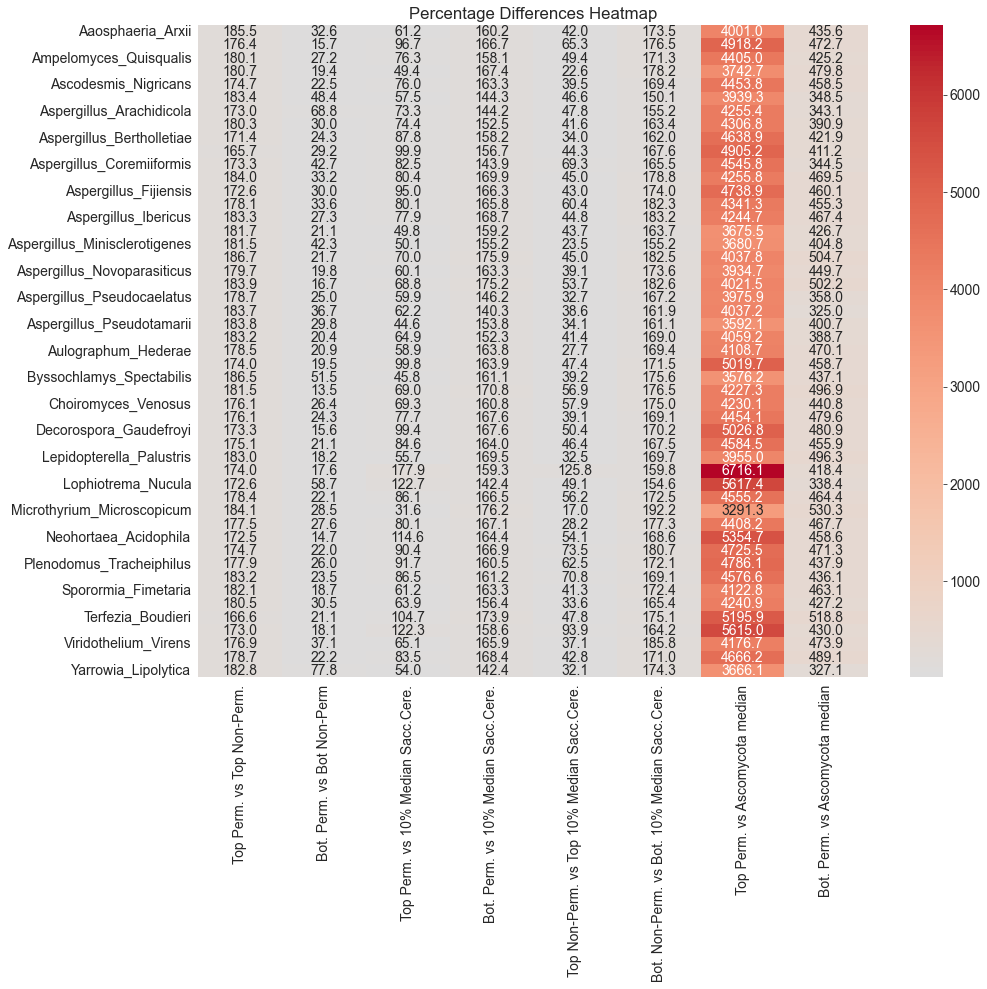

In [638]:
plt.figure(figsize=(15, 12))
sns.heatmap(percentage_diff_species, cmap='coolwarm', center=0, annot=True, fmt=".1f")
plt.title('Percentage Differences Heatmap')
plt.show()


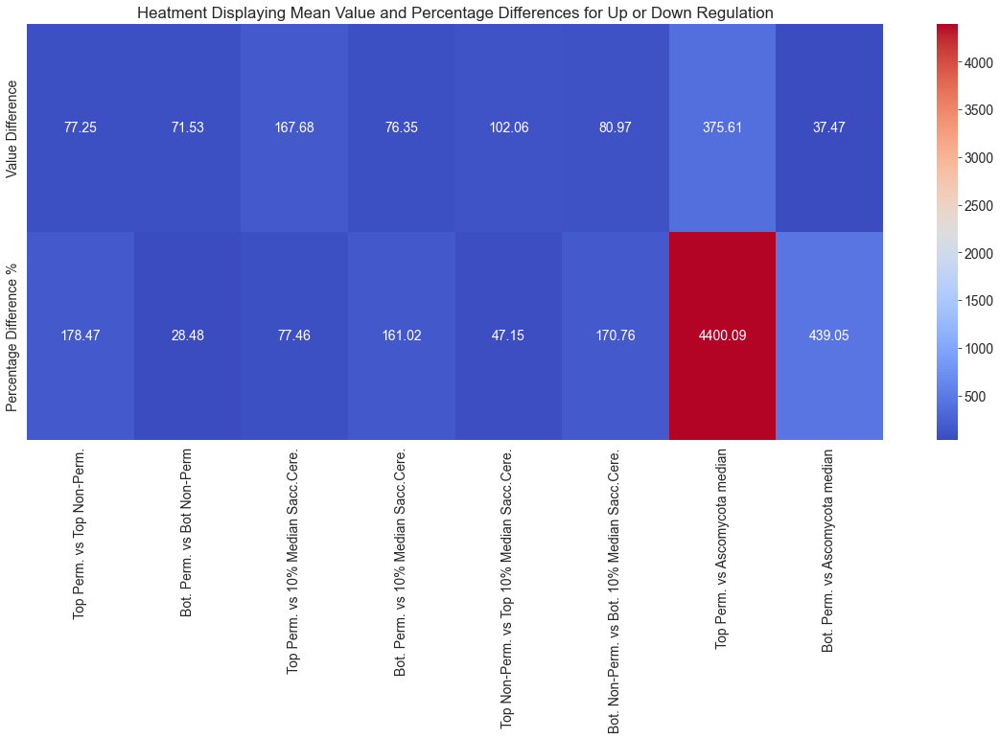

In [639]:
# Initialize an empty DataFrame to store our results
value_diff_species = pd.DataFrame()

#Loop through each species
for species in species_list:
    top_expr_species = df_top_10_expr_long[df_top_10_expr_long['Species'] == species]
    bot_expr_species = df_bottom_10_expr_long[df_bottom_10_expr_long['Species'] == species]
    top_perm_species = df_top_expression_perm[df_top_expression_perm['Species'] == species]
    bot_perm_species = df_bot_expression_perm[df_bot_expression_perm['Species'] == species]
    
    # Calculate medians for gfp_pred_dict
    median_gfp_pred_dict_species = np.median(gfp_pred_dict[species])
    
    value_diff_species.loc[species, 'Top Perm. vs Top Non-Perm.'] = top_perm_species['Expression Level'].median() - top_expr_species['Expression Level'].median()
    value_diff_species.loc[species, 'Bot. Perm. vs Bot Non-Perm'] = bot_perm_species['Expression Level'].median() - - bot_expr_species['Expression Level'].median()
    value_diff_species.loc[species, 'Top Perm. vs 10% Median Sacc.Cere.'] = top_perm_species['Expression Level'].max() - top_10_percent_median
    value_diff_species.loc[species, 'Bot. Perm. vs 10% Median Sacc.Cere.'] = bot_perm_species['Expression Level'].min() - - min_sc_gfp_data
    
    value_diff_species.loc[species, 'Top Non-Perm. vs Top 10% Median Sacc.Cere.'] = top_expr_species['Expression Level'].max() - top_10_percent_median
    value_diff_species.loc[species, 'Bot. Non-Perm. vs Bot. 10% Median Sacc.Cere.'] = bot_expr_species['Expression Level'].min() - - min_sc_gfp_data
    
    value_diff_species.loc[species, 'Top Perm. vs Ascomycota median'] = top_perm_species['Expression Level'].max() - median_gfp_pred_dict_species
    value_diff_species.loc[species, 'Bot. Perm. vs Ascomycota median'] = bot_perm_species['Expression Level'].min() - - median_gfp_pred_dict_species

# Calculate the overall mean for each comparison type
percentage_diff_overall = percentage_diff_species.mean()

# Calculate the overall mean for each comparison type
value_diff_overall = value_diff_species.mean()

# Concatenate the value_diff_overall and percentage_diff_overall DataFrames
overall_diff = pd.concat([value_diff_overall, percentage_diff_overall], keys=['Value Difference', 'Percentage Difference %'])

# Transform the concatenated Series into a DataFrame
overall_diff_df = overall_diff.unstack()

# Display the overall differences as a heatmap
plt.figure(figsize=(20,8))
sns.heatmap(overall_diff_df, annot=True, fmt=".2f", cmap="coolwarm")
plt.title('Heatment Displaying Mean Value and Percentage Differences for Up or Down Regulation')
plt.show()

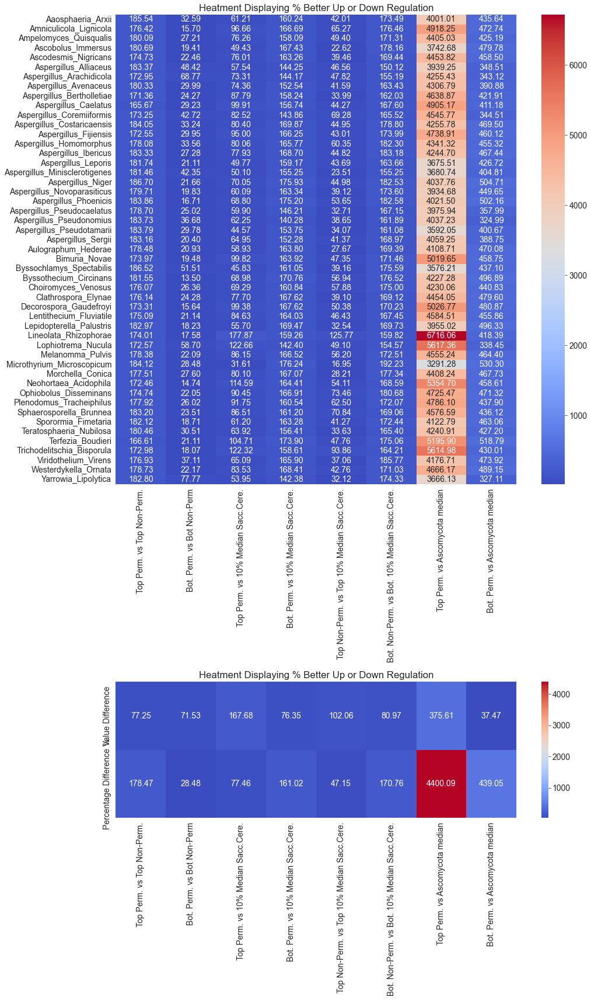

In [640]:
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(15, 24))

# Define the gridspec
gs = gridspec.GridSpec(3, 1)

# Assign more space to the first plot
ax0 = plt.subplot(gs[0:2, :])
sns.heatmap(percentage_diff_species, annot=True, fmt=".2f", cmap="coolwarm", ax=ax0)
ax0.set_title('Heatment Displaying % Better Up or Down Regulation')

# Assign less space to the second plot
ax1 = plt.subplot(gs[2, :])
sns.heatmap(overall_diff_df, annot=True, fmt=".2f", cmap="coolwarm", ax=ax1)
ax1.set_title('Heatment Displaying % Better Up or Down Regulation')

plt.tight_layout()
plt.show()

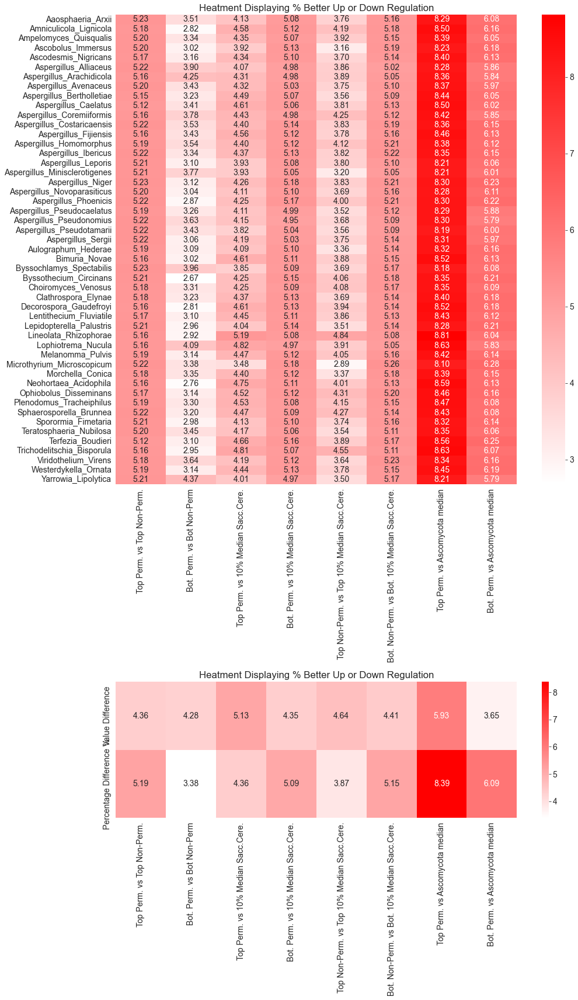

In [641]:
import numpy as np
import matplotlib.colors as mcolors

# Create a custom colormap from white to red
cmap = mcolors.LinearSegmentedColormap.from_list("myColormap", ["white", "red"])

fig = plt.figure(figsize=(15, 24))

# Define the gridspec
gs = gridspec.GridSpec(3, 1)

# Take logarithm of your data
log_percentage_diff_species = np.log1p(percentage_diff_species)
log_percentage_diff_overall = np.log1p(overall_diff_df)

# Assign more space to the first plot
ax0 = plt.subplot(gs[0:2, :])
sns.heatmap(log_percentage_diff_species, annot=True, fmt=".2f", cmap=cmap, ax=ax0)
ax0.set_title('Heatment Displaying % Better Up or Down Regulation')

# Assign less space to the second plot
ax1 = plt.subplot(gs[2, :])
sns.heatmap(log_percentage_diff_overall, annot=True, fmt=".2f", cmap=cmap, ax=ax1)
ax1.set_title('Heatment Displaying % Better Up or Down Regulation')

plt.tight_layout()
plt.show()


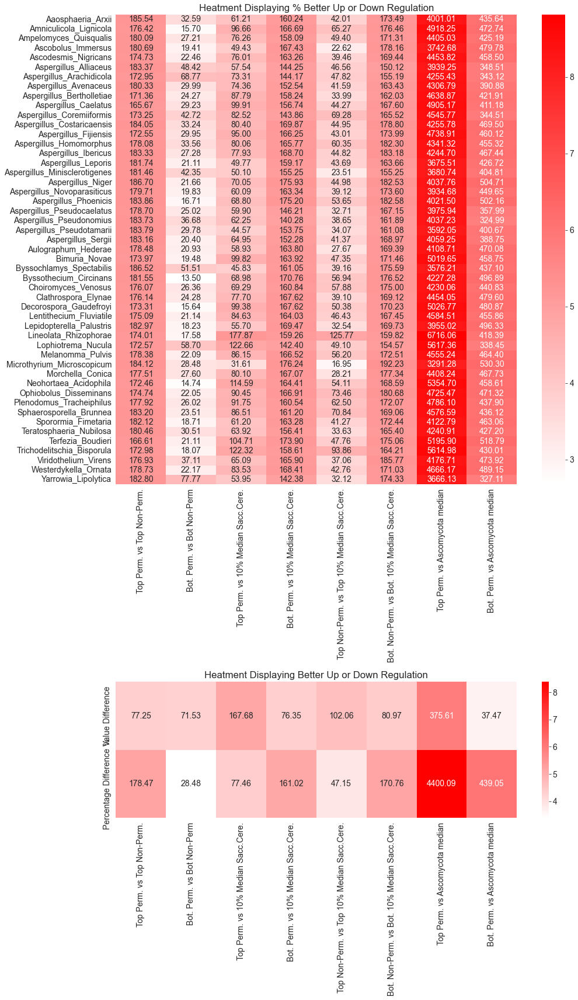

In [642]:
fig = plt.figure(figsize=(15, 24))

# Define the gridspec
gs = gridspec.GridSpec(3, 1)

# Assign more space to the first plot
ax0 = plt.subplot(gs[0:2, :])
sns.heatmap(log_percentage_diff_species, annot=percentage_diff_species, fmt=".2f", cmap=cmap, ax=ax0)
ax0.set_title('Heatment Displaying % Better Up or Down Regulation')

# Assign less space to the second plot
ax1 = plt.subplot(gs[2, :])
sns.heatmap(log_percentage_diff_overall, annot=overall_diff_df, fmt=".2f", cmap=cmap, ax=ax1)
ax1.set_title('Heatment Displaying Better Up or Down Regulation')

plt.tight_layout()
plt.show()

In [643]:
sc_top_10_percent_median = top_10_percent_median
sc_bot_10_percent_median = min_sc_gfp_data

In [644]:
# Load the predictions from the npy file
pred_file = 'D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_combined_output/GFP_Ascomycota_pred.npy'
pred_array = np.load(pred_file)
pred_array = pred_array.flatten()  

pred_file = r"D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_permutate/Permutated_Up_Pred.npy"
permutate_top_pred_array = np.load(pred_file)
permutate_top_pred_array = permutate_top_pred_array.flatten()

pred_file = r"D:/Users/ernes/Documents/1KCL/Zelezniak/DeepExpressionWorking/2018_11_26/gfp_data_permutate/Permutated_Down_Pred.npy"
permutate_bot_pred_array = np.load(pred_file)
permutate_bot_pred_array = permutate_bot_pred_array.flatten()

In [645]:
pred_array = boxtpm(pred_array, lmbda)
permutate_top_pred_array = boxtpm(permutate_top_pred_array, lmbda)
permutate_bot_pred_array = boxtpm(permutate_bot_pred_array, lmbda)

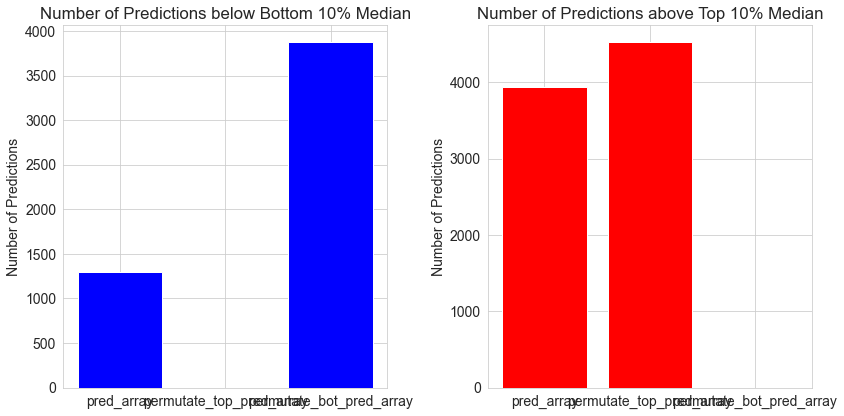

In [646]:
# count predictions in each array
counts_below = {'pred_array': np.sum(pred_array < sc_bot_10_percent_median),
          'permutate_top_pred_array': np.sum(permutate_top_pred_array < sc_bot_10_percent_median),
          'permutate_bot_pred_array': np.sum(permutate_bot_pred_array < sc_bot_10_percent_median)}

counts_above = {'pred_array': np.sum(pred_array > sc_top_10_percent_median),
          'permutate_top_pred_array': np.sum(permutate_top_pred_array > sc_top_10_percent_median),
          'permutate_bot_pred_array': np.sum(permutate_bot_pred_array > sc_top_10_percent_median)}

# create bar plot for predictions below sc_bot_10_percent_median
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)  # 1 row, 2 columns, plot 1
plt.bar(counts_below.keys(), counts_below.values(), color='blue')
plt.title('Number of Predictions below Bottom 10% Median')
plt.ylabel('Number of Predictions')

# create bar plot for predictions above sc_top_10_percent_median
plt.subplot(1, 2, 2)  # 1 row, 2 columns, plot 2
plt.bar(counts_above.keys(), counts_above.values(), color='red')
plt.title('Number of Predictions above Top 10% Median')
plt.ylabel('Number of Predictions')

plt.tight_layout()  # to ensure proper spacing between subplots
plt.show()


D:\Users\ernes\Documents\Anaconda\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
D:\Users\ernes\Documents\Anaconda\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


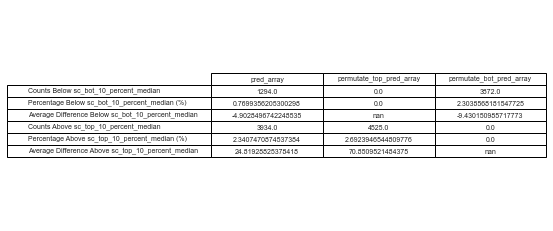

                                                    pred_array  \
Counts Below sc_bot_10_percent_median              1294.000000   
Percentage Below sc_bot_10_percent_median (%)         0.769936   
Average Difference Below sc_bot_10_percent_median    -4.902850   
Counts Above sc_top_10_percent_median              3934.000000   
Percentage Above sc_top_10_percent_median (%)         2.340747   
Average Difference Above sc_top_10_percent_median    24.819288   

                                                   permutate_top_pred_array  \
Counts Below sc_bot_10_percent_median                              0.000000   
Percentage Below sc_bot_10_percent_median (%)                      0.000000   
Average Difference Below sc_bot_10_percent_median                       NaN   
Counts Above sc_top_10_percent_median                           4525.000000   
Percentage Above sc_top_10_percent_median (%)                      2.692395   
Average Difference Above sc_top_10_percent_median              

In [647]:
# count predictions in each array
counts_below = {'pred_array': np.sum(pred_array < sc_bot_10_percent_median),
          'permutate_top_pred_array': np.sum(permutate_top_pred_array < sc_bot_10_percent_median),
          'permutate_bot_pred_array': np.sum(permutate_bot_pred_array < sc_bot_10_percent_median)}

counts_above = {'pred_array': np.sum(pred_array > sc_top_10_percent_median),
          'permutate_top_pred_array': np.sum(permutate_top_pred_array > sc_top_10_percent_median),
          'permutate_bot_pred_array': np.sum(permutate_bot_pred_array > sc_top_10_percent_median)}

# calculate percentage of predictions
percent_below = {key: value / len(pred_array) * 100 for key, value in counts_below.items()}
percent_above = {key: value / len(pred_array) * 100 for key, value in counts_above.items()}

# calculate average difference from the median
avg_diff_below = {'pred_array': np.mean(pred_array[pred_array < sc_bot_10_percent_median] - sc_bot_10_percent_median),
          'permutate_top_pred_array': np.mean(permutate_top_pred_array[permutate_top_pred_array < sc_bot_10_percent_median] - sc_bot_10_percent_median),
          'permutate_bot_pred_array': np.mean(permutate_bot_pred_array[permutate_bot_pred_array < sc_bot_10_percent_median] - sc_bot_10_percent_median)}

avg_diff_above = {'pred_array': np.mean(pred_array[pred_array > sc_top_10_percent_median] - sc_top_10_percent_median),
          'permutate_top_pred_array': np.mean(permutate_top_pred_array[permutate_top_pred_array > sc_top_10_percent_median] - sc_top_10_percent_median),
          'permutate_bot_pred_array': np.mean(permutate_bot_pred_array[permutate_bot_pred_array > sc_top_10_percent_median] - sc_top_10_percent_median)}

# create DataFrame
df = pd.DataFrame([counts_below, percent_below, avg_diff_below, counts_above, percent_above, avg_diff_above], 
                  index=['Counts Below sc_bot_10_percent_median', 'Percentage Below sc_bot_10_percent_median (%)',
                         'Average Difference Below sc_bot_10_percent_median', 'Counts Above sc_top_10_percent_median',
                         'Percentage Above sc_top_10_percent_median (%)', 'Average Difference Above sc_top_10_percent_median'])

# Render dataframe as a matplotlib table
fig, ax = plt.subplots(1, 1)
table_data = []
columns = df.columns.tolist()
index = df.index.tolist()
for i in index:
    table_data.append(df.loc[i].tolist())
ax.axis('tight')
ax.axis('off')
ax.table(cellText=table_data, colLabels=columns, rowLabels=index, cellLoc = 'center', loc='center')

plt.show()

print(df)